### Atomic Alerts theft detection
#### Author : Shweta Gupta
#### Date : 03/27/2020


In [240]:
#importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from pandasql import sqldf

#read and store the dataset from csv file
path ='C:\\Users\shwet\Documents\shweta\Winter_2020/Integearte_ALY6080/GE_Data/indicator_data.csv'
ind_data = pd.read_csv(path)
heat_score = pd.read_csv("C:\\Users\shwet\Documents\shweta\Winter_2020/Integearte_ALY6080/GE_Data/heat_scores.csv")
demo_data = pd.read_csv("C:\\Users\shwet\Documents\shweta\Winter_2020/Integearte_ALY6080/GE_Data/obfuscated_demo_data.csv")
demo_data_upd = pd.read_csv("C:\\Users\shwet\Documents\shweta\Winter_2020/Integearte_ALY6080/GE_Data/obfuscated_demo_data2_no_dup.csv")
ind_pair_data =  pd.read_csv("C:\\Users\shwet\Documents\shweta\Winter_2020/Integearte_ALY6080/GE_Data/indicator_pairs_data.csv")
ind_pair_data_upd =  pd.read_csv("C:\\Users\shwet\Documents\shweta\Winter_2020/Integearte_ALY6080/GE_Data/indicator_pairs_data updated.csv")

pysqldf = lambda q: sqldf(q, globals())

Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.


In [241]:
#installing pandasql
# pip install pandasql
#importing sqldf
from pandasql import sqldf
# defining function with sqldf parameters
pysqldf = lambda q: sqldf(q, globals())

In [5]:
# merging employee and indicator_pair
q = """
select  a.*,b.*
      from ind_pair_data_upd a inner join demo_data_upd b
      on a.employee_id = b.employee_id ;
"""
dd =pysqldf(q)



In [264]:
# imputing tenure
demo_data_upd['ge_hire_date'] = demo_data_upd['ge_hire_date'].astype('datetime64[ns]') 
demo_data_upd['ge_hire_year']=demo_data_upd['ge_hire_date'].dt.year
from datetime import datetime
demo_data_upd['employee_tenure']=datetime.today().year - demo_data_upd['ge_hire_year']

#imputing missing value
demo_data_upd["country_name"].fillna("No_Data", inplace = True)
demo_data_upd["state_name"].fillna("No_Data", inplace = True)
demo_data_upd["city"].fillna("No_Data", inplace = True)
demo_data_upd["function_group"].fillna("No_Data", inplace = True)

In [243]:
df_new= pd.get_dummies( demo_data_upd, columns = ['job_function','career_band'] )
# print(df_new.head(10))
test = df_new[df_new['employee_tenure'].isnull()== True]
train = df_new[df_new['employee_tenure'].isnull()== False]

x_test = test.iloc[:,11:]
y_test = test.employee_tenure
y = train.employee_tenure
x = train.iloc[:,11:]
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2)
# train.employee_tenure

In [281]:
#Fit models
from sklearn.linear_model import LogisticRegression

# Scoring functions
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
#building logsitic regression
xmod = xtrain
ymod = ytrain
xmodt = xtest
ymodt = ytest
logreg = LogisticRegression()
logreg.fit(xmod, ymod)
y_pred = logreg.predict(xmodt)

print('Accuarcy score ='+str(accuracy_score(ymodt, y_pred)))

Accuarcy score =0.11753731343283583


In [282]:
from sklearn.tree import DecisionTreeRegressor

clf = DecisionTreeRegressor()

# Train Decision Tree Classifer
clf = clf.fit(x,y)

#Predict the response for test dataset
y_pred = clf.predict(xtest)
y_pred=round(pd.DataFrame(y_pred),0)


In [283]:
test.reset_index(drop=True, inplace=True)
test['Predicted_tenure']=round(pd.DataFrame(y_pred),0)
test


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,employee_id,person_type,person_status,ge_hire_date,city,state_name,country_name,function_group,industry_focus_name,ge_hire_year,...,career_band_CAREER_BAND_10,career_band_CAREER_BAND_2,career_band_CAREER_BAND_3,career_band_CAREER_BAND_4,career_band_CAREER_BAND_5,career_band_CAREER_BAND_6,career_band_CAREER_BAND_7,career_band_CAREER_BAND_8,career_band_CAREER_BAND_9,Predicted_tenure
0,8714002494,EMPLOYEE,A,NaT,Arnhem,No_Data,No_Data,No_Data,BUSINESS_SEGMENT_8,NaN,...,0,0,0,0,0,0,0,0,0,9.0
1,187153423,EMPLOYEE,A,NaT,Luanda,No_Data,No_Data,No_Data,BUSINESS_SEGMENT_1,NaN,...,0,0,0,0,0,0,0,0,0,21.0
2,4680091097,EMPLOYEE,A,NaT,Jandakot,No_Data,No_Data,No_Data,BUSINESS_SEGMENT_11,NaN,...,0,0,0,0,0,0,0,0,0,13.0
3,9678700500,EMPLOYEE,A,NaT,Florence,No_Data,No_Data,No_Data,BUSINESS_SEGMENT_11,NaN,...,0,0,0,0,0,0,0,0,0,9.0
4,19639355437,EMPLOYEE,A,NaT,Marlborough,No_Data,No_Data,No_Data,BUSINESS_SEGMENT_10,NaN,...,0,0,0,0,0,0,0,0,0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
473,21636800474,CONTRACTOR,A,NaT,West Chester,Ohio,No_Data,Production,BUSINESS_SEGMENT_4,NaN,...,0,0,0,0,0,1,0,0,0,9.0
474,3681779563,CONTRACTOR,I,NaT,Taoyuan City,Taoyuan,No_Data,Enabling,BUSINESS_SEGMENT_4,NaN,...,0,0,0,0,0,1,0,0,0,8.0
475,31821555002,CONTRACTOR,A,NaT,Evendale,Ohio,No_Data,Production,BUSINESS_SEGMENT_4,NaN,...,0,0,0,0,0,1,0,0,0,19.0
476,27257159095,CONTRACTOR,I,NaT,Warsaw,No_Data,No_Data,No_Data,BUSINESS_SEGMENT_4,NaN,...,0,0,0,0,0,0,0,0,0,19.0


In [284]:
#updating the predicted values
q = """
select  a.*,
(case when a.employee_tenure is null then(select t.Predicted_tenure from test t where t.employee_id = a.employee_id )
     else
     a.employee_tenure
END) employee_tenure_cal
      from demo_data_upd a;
"""
emp_data =pysqldf(q)

In [285]:
emp_data['employee_tenure']=emp_data['employee_tenure_cal']
emp_data=emp_data.drop(columns = ['employee_tenure_cal'])
# emp_data.to_csv('emp_data.csv')

In [286]:
# merging employee and indicator_pair
q = """
select  a.*,b.*
      from ind_pair_data_upd a inner join emp_data b
      on a.employee_id = b.employee_id ;
"""
merge_data =pysqldf(q)

In [287]:
#removing duplicate columns
final_data = merge_data.loc[:,~merge_data.columns.duplicated()]

In [288]:
final_data.shape[0]

132079

In [289]:
# splitting the indicator pairs to extract indicators
from pandas import Series
s = final_data['indicator_pairs'].str.split('/').apply(Series, 1).stack()
s
s.index = s.index.droplevel(-1)
s.name = 'indicators'
print(s)
# del final_data['indicator_pairs']
model_data = final_data.join(s)

0         App_9_Atomic_DVD_Burn_IND
1         App_9_Atomic_DVD_Burn_IND
2         App_9_Atomic_DVD_Burn_IND
3         App_9_Atomic_DVD_Burn_IND
4         App_9_Atomic_DVD_Burn_IND
                    ...            
132077         App_3_Heat_Email_ZIP
132077         App_9_Heat_Email_IND
132077     Threshold_Heat_Email_IND
132078          App_3_Heat_Email_CD
132078     Threshold_Heat_Email_IND
Name: indicators, Length: 218758, dtype: object


In [290]:
#imputing missing value
model_data["country_name"].fillna("No_Data", inplace = True)
model_data["state_name"].fillna("No_Data", inplace = True)
model_data["city"].fillna("No_Data", inplace = True)
model_data["owner_name"].fillna("No_Data", inplace = True)
model_data["function_group"].fillna("No_Data", inplace = True)

In [297]:
model_data.to_csv('Model_data.csv')

In [296]:
# model_data.columns
# # printing the columns
# count=0
# for col in model_data.columns: 
#     count= count+1
#     print(col) 
# print('column count-'+str(count))

In [28]:
# filtering only atomic records
atomic_model_data = model_data[model_data['alert_category']=='Atomic']
# removing duplicates rows
atomic_model_data.drop_duplicates(keep='last',inplace=True)
# atomic_model_data.to_csv('Atomic_Model_Data.csv')

C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [29]:
atomic_model_data.shape[0]

92604

In [36]:
#checking duplicate count
# d=atomic_model_data.duplicated(subset=None, keep='last')
# d.value_counts()

FP         53375
TP/DE      36304
TP/LOW      2702
TP/HIGH      223
Name: classification, dtype: int64

In [39]:
atomic_model_data['classification'].value_counts()

FP         53375
TP/DE      36304
TP/LOW      2702
TP/HIGH      223
Name: classification, dtype: int64

In [37]:
#dropping the features not needed
atomic_model_final_data = atomic_model_data.drop(columns = ['risk_factor','alert_id_fk','score','indicator_pairs','avg_score','ge_hire_date','alert_escalation_date','insert_date','city','state_name','ge_hire_year','alert_category','alert_type'])

In [38]:
#checking for missing values
atomic_model_final_data.isna().sum()

owner_name             0
employee_id            0
classification         0
hru                    0
person_type            0
person_status          0
country_name           0
function_group         0
job_function           0
career_band            0
industry_focus_name    0
employee_tenure        0
indicators             0
dtype: int64

In [226]:
cluster_data = pd.get_dummies( atomic_model_final_data, columns = ['classification','owner_name','function_group',
'hru',
'person_type',
'person_status',
'country_name',
'job_function',
'career_band',
'industry_focus_name',
'indicators'] )

In [235]:
cluster_data.head(10)

,employee_tenure,classification_Label,classification_FP,classification_TP/DE,classification_TP/HIGH,classification_TP/LOW,owner_name_Analyst_1,owner_name_Analyst_4,owner_name_Analyst_5,owner_name_Analyst_6,...,indicators_App_9_Heat_USB_IND,indicators_App_9_Threshold_Access_>8,indicators_App_9_Threshold_Access_Confidential>10,indicators_App_9_Threshold_Access_Confidential>15,indicators_App_9_Threshold_Access_Confidential>5,indicators_Threshold_Heat_BA_IND,indicators_Threshold_Heat_Email_IND,indicators_Threshold_Heat_Print_IND,indicators_Top_Users_Heat_Egress_IND,indicators_Top_Users_Heat_USB_IND
0,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [232]:
# removing employee_id as it a unique id for each employee
cluster_data.columns

Index(['employee_tenure', 'classification_Label', 'classification_FP',
       'classification_TP/DE', 'classification_TP/HIGH',
       'classification_TP/LOW', 'owner_name_Analyst_1', 'owner_name_Analyst_4',
       'owner_name_Analyst_5', 'owner_name_Analyst_6',
       ...
       'indicators_App_9_Heat_USB_IND', 'indicators_App_9_Threshold_Access_>8',
       'indicators_App_9_Threshold_Access_Confidential>10',
       'indicators_App_9_Threshold_Access_Confidential>15',
       'indicators_App_9_Threshold_Access_Confidential>5',
       'indicators_Threshold_Heat_BA_IND',
       'indicators_Threshold_Heat_Email_IND',
       'indicators_Threshold_Heat_Print_IND',
       'indicators_Top_Users_Heat_Egress_IND',
       'indicators_Top_Users_Heat_USB_IND'],
      dtype='object', length=124)

In [228]:
atomic_model_final_data = atomic_model_data.drop(columns = ['employee_id','employee_tenure','risk_factor','alert_id_fk','score','indicator_pairs','avg_score','ge_hire_date','alert_escalation_date','insert_date','city','state_name','ge_hire_year','alert_category','alert_type'])

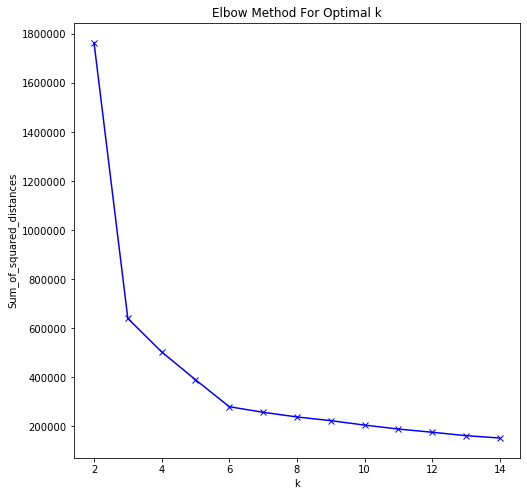

In [234]:
# Elbow plot for k means
from sklearn.cluster import KMeans
Sum_of_squared_distances = []
K = range(2,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(cluster_data)
    Sum_of_squared_distances.append(km.inertia_)
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [237]:
kmeans = KMeans(n_clusters=5)
y_kmeans = kmeans.fit_predict(cluster_data)
print(y_kmeans)
cluster_data = cluster_data.reset_index()
kmeanpredtDf = pd.DataFrame(y_kmeans)
kmeanpredtDf.columns = ['cluster']
kmeanclustdf = pd.concat([cluster_data, kmeanpredtDf], axis = 1).reset_index()
kmeanclustdf = kmeanclustdf.drop(['index', 'level_0'], axis = 1)
kmeanclustdf.head(10)

[0 0 0 ... 3 3 0]


,employee_tenure,classification_Label,classification_FP,classification_TP/DE,classification_TP/HIGH,classification_TP/LOW,owner_name_Analyst_1,owner_name_Analyst_4,owner_name_Analyst_5,owner_name_Analyst_6,...,indicators_App_9_Threshold_Access_>8,indicators_App_9_Threshold_Access_Confidential>10,indicators_App_9_Threshold_Access_Confidential>15,indicators_App_9_Threshold_Access_Confidential>5,indicators_Threshold_Heat_BA_IND,indicators_Threshold_Heat_Email_IND,indicators_Threshold_Heat_Print_IND,indicators_Top_Users_Heat_Egress_IND,indicators_Top_Users_Heat_USB_IND,cluster
0,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,14.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [90]:
cost = []
for num_clusters in list(range(3,10)):
    kmode = KModes(n_clusters=num_clusters, init = "Huang", n_init = 1, verbose=1)
    kmode.fit_predict(cluster_data)
    cost.append(kmode.cost_)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 33605, cost: 457178.0
Run 1, iteration: 2/100, moves: 7627, cost: 457177.0
Run 1, iteration: 3/100, moves: 0, cost: 457177.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 14399, cost: 457188.0
Run 1, iteration: 2/100, moves: 0, cost: 457188.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 7576, cost: 371074.0
Run 1, iteration: 2/100, moves: 538, cost: 371074.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 20658, cost: 363286.0
Run 1, iteration: 2/100, moves: 0, cost: 363286.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 16705, cost: 440215.0
Run 1, iteration: 2/100, moves: 3362, cost: 440036.0
Run 1, iteration: 3/100

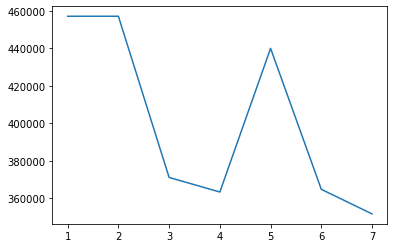

In [92]:
y = np.array([i for i in range(1,8,1)])
plt.plot(y,cost)

In [101]:
#-------------------------------------------------------------------------------------------------------------------------------
# -------------------------------------CLUSTERING : K Mode----------------------------------------------------------------------
#-------------------------------------------------------------------------------------------------------------------------------

#import library
from kmodes.kmodes import KModes

# -------Kmodes for 4 ----------------------
kmode5= KModes(n_clusters=4, init='Huang',n_init = 5 , verbose =1)
kmodeclusters5 = kmode5.fit_predict(cluster_data)

#concatinating the cluster with dataframe
# cluster_data = cluster_data.reset_index()
clustDf = pd.DataFrame(kmodeclusters5)
clustDf.columns = ['cluster_predicted']
kmodeclustdf = pd.concat([cluster_data, clustDf], axis = 1)
kmodeclustdf = kmodeclustdf.drop(['index', 'level_0'], axis = 1)
kmodeclustdf.head()

# grouping and summing the counts by clusters
grouped = kmodeclustdf.groupby(['cluster_predicted'], sort=True)
sums = grouped.sum()
sums
sums.to_csv('final_cluster_k_mode.csv')

# calculating the mean columnwise for the clusters
for i in range(1,123):
    col_total = sums.iloc[:,i].sum(axis=0)
    for k in range(0,4):
        sums.iloc[k,i] = round(sums.iloc[k,i]/col_total,2)
# saving the output to csv file
sums.to_csv('final_cluster_k_mode.csv', mode='a', header=True)

# -------Kmodes for 5 ----------------------
kmode5= KModes(n_clusters=5, init='Huang',n_init = 10, verbose =1)
kmodeclusters5 = kmode5.fit_predict(cluster_data)

#concatinating the cluster with dataframe
# cluster_data = cluster_data.reset_index()
clustDf = pd.DataFrame(kmodeclusters5)
clustDf.columns = ['cluster_predicted']
kmodeclustdf = pd.concat([cluster_data, clustDf], axis = 1)
kmodeclustdf = kmodeclustdf.drop(['index', 'level_0'], axis = 1)
kmodeclustdf.head()

# grouping and summing the counts by clusters
grouped = kmodeclustdf.groupby(['cluster_predicted'], sort=True)
sums = grouped.sum()
sums
sums.to_csv('final_cluster_k_mode.csv', mode='a', header=True)

# calculating the mean columnwise for the clusters
for i in range(1,123):
    col_total = sums.iloc[:,i].sum(axis=0)
    for k in range(0,5):
        sums.iloc[k,i] = round(sums.iloc[k,i]/col_total,2)
# saving the output to csv file
sums.to_csv('final_cluster_k_mode.csv', mode='a', header=True)

# -------Kmodes for 6 ----------------------
kmode5= KModes(n_clusters=6, init='Huang',n_init = 10, verbose =1)
kmodeclusters5 = kmode5.fit_predict(cluster_data)

#concatinating the cluster with dataframe
# cluster_data = cluster_data.reset_index()
clustDf = pd.DataFrame(kmodeclusters5)
clustDf.columns = ['cluster_predicted']
kmodeclustdf = pd.concat([cluster_data, clustDf], axis = 1)
kmodeclustdf = kmodeclustdf.drop(['index', 'level_0'], axis = 1)
kmodeclustdf.head()

# grouping and summing the counts by clusters
grouped = kmodeclustdf.groupby(['cluster_predicted'], sort=True)
sums = grouped.sum()
sums
sums.to_csv('final_cluster_k_mode.csv', mode='a', header=True)

# calculating the mean columnwise for the clusters
for i in range(1,123):
    col_total = sums.iloc[:,i].sum(axis=0)
    for k in range(0,6):
        sums.iloc[k,i] = round(sums.iloc[k,i]/col_total,2)
# saving the output to csv file
sums.to_csv('final_cluster_k_mode.csv', mode='a', header=True)

# -------Kmodes for 8 ----------------------
kmode5= KModes(n_clusters=8, init='Huang',n_init = 10, verbose =1)
kmodeclusters5 = kmode5.fit_predict(cluster_data)

#concatinating the cluster with dataframe
# cluster_data = cluster_data.reset_index()
clustDf = pd.DataFrame(kmodeclusters5)
clustDf.columns = ['cluster_predicted']
kmodeclustdf = pd.concat([cluster_data, clustDf], axis = 1)
kmodeclustdf = kmodeclustdf.drop(['index', 'level_0'], axis = 1)
kmodeclustdf.head()

# grouping and summing the counts by clusters
grouped = kmodeclustdf.groupby(['cluster_predicted'], sort=True)
sums = grouped.sum()
sums
sums.to_csv('final_cluster_k_mode.csv', mode='a', header=True)

# calculating the mean columnwise for the clusters
for i in range(1,123):
    col_total = sums.iloc[:,i].sum(axis=0)
    for k in range(0,8):
        sums.iloc[k,i] = round(sums.iloc[k,i]/col_total,2)
# saving the output to csv file
sums.to_csv('final_cluster_k_mode.csv', mode='a', header=True)

# -------Kmodes for 10 ----------------------
kmode5= KModes(n_clusters=10, init='Huang',n_init = 10, verbose =1)
kmodeclusters5 = kmode5.fit_predict(cluster_data)

#concatinating the cluster with dataframe
# cluster_data = cluster_data.reset_index()
clustDf = pd.DataFrame(kmodeclusters5)
clustDf.columns = ['cluster_predicted']
kmodeclustdf = pd.concat([cluster_data, clustDf], axis = 1)
kmodeclustdf = kmodeclustdf.drop(['index', 'level_0'], axis = 1)
kmodeclustdf.head()

# grouping and summing the counts by clusters
grouped = kmodeclustdf.groupby(['cluster_predicted'], sort=True)
sums = grouped.sum()
sums
sums.to_csv('final_cluster_k_mode.csv', mode='a', header=True)

# calculating the mean columnwise for the clusters
for i in range(1,123):
    col_total = sums.iloc[:,i].sum(axis=0)
    for k in range(0,10):
        sums.iloc[k,i] = round(sums.iloc[k,i]/col_total,2)
# saving the output to csv file
sums.to_csv('final_cluster_k_mode.csv', mode='a', header=True)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 21487, cost: 443672.0
Run 1, iteration: 2/100, moves: 67, cost: 443672.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 16230, cost: 405026.0
Run 2, iteration: 2/100, moves: 3800, cost: 405026.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 21982, cost: 444429.0
Run 3, iteration: 2/100, moves: 0, cost: 444429.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 14870, cost: 462515.0
Run 4, iteration: 2/100, moves: 235, cost: 462514.0
Run 4, iteration: 3/100, moves: 0, cost: 462514.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 21344, cost: 462516.0
Run 5, iteration: 2/100, moves: 2741, cost: 462514.0
Run 5, iteration: 3/1

Run 10, iteration: 2/100, moves: 530, cost: 365044.0
Run 10, iteration: 3/100, moves: 0, cost: 365044.0
Best run was number 5
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 12748, cost: 340477.0
Run 1, iteration: 2/100, moves: 2942, cost: 340295.0
Run 1, iteration: 3/100, moves: 618, cost: 340295.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 20604, cost: 335518.0
Run 2, iteration: 2/100, moves: 3334, cost: 334017.0
Run 2, iteration: 3/100, moves: 1048, cost: 333847.0
Run 2, iteration: 4/100, moves: 519, cost: 333847.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 8872, cost: 342676.0
Run 3, iteration: 2/100, moves: 3282, cost: 338907.0
Run 3, iteration: 3/100, moves: 1749, cost: 338907.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100,

In [34]:
cluster_data = cluster_data.reset_index()
clustDf = pd.DataFrame(kmodeclusters5)
clustDf.columns = ['cluster_predicted']
kmodeclustdf = pd.concat([cluster_data, clustDf], axis = 1).reset_index()
kmodeclustdf = kmodeclustdf.drop(['index', 'level_0'], axis = 1)
kmodeclustdf.head()

,employee_tenure,classification_FP,classification_TP/DE,classification_TP/HIGH,classification_TP/LOW,owner_name_Analyst_1,owner_name_Analyst_4,owner_name_Analyst_5,owner_name_Analyst_6,owner_name_Analyst_7,...,indicators_App_9_Threshold_Access_>8,indicators_App_9_Threshold_Access_Confidential>10,indicators_App_9_Threshold_Access_Confidential>15,indicators_App_9_Threshold_Access_Confidential>5,indicators_Threshold_Heat_BA_IND,indicators_Threshold_Heat_Email_IND,indicators_Threshold_Heat_Print_IND,indicators_Top_Users_Heat_Egress_IND,indicators_Top_Users_Heat_USB_IND,cluster_predicted
0,14.0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,14.0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,14.0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,14.0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,14.0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [89]:
#concatinating the cluster with dataframe
clustDf = pd.DataFrame(kmodeclusters6)
clustDf.columns = ['cluster_predicted']
kmodeclustdf = pd.concat([cluster_data, clustDf], axis = 1)
kmodeclustdf = kmodeclustdf.drop(['index', 'level_0'], axis = 1)
kmodeclustdf.head()

# grouping and summing the counts by clusters
grouped = kmodeclustdf.groupby(['cluster_predicted'], sort=True)
sums = grouped.sum()
sums
sums.to_csv('final_cluster_k_mode.csv', mode='a', header=True)

# calculating the mean columnwise for the clusters
for i in range(1,123):
    col_total = sums.iloc[:,i].sum(axis=0)
    for k in range(0,5):
        sums.iloc[k,i] = round(sums.iloc[k,i]/col_total,2)
# saving the output to csv file
sums.to_csv('final_cluster_k_mode.csv', mode='a', header=True)

In [39]:
#-------------------------------------------
#------modelling---------------------------
#----------------------------------------------
from imblearn.over_sampling import SMOTE
# Fit models
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# Scoring functions
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix
from sklearn import metrics

Using TensorFlow backend.
C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\tensorflow\python\framework\dtypes.py:519: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\shwet\Anaconda3\envs\py36\lib\site-packag

In [40]:
atomic_model_final_data = atomic_model_data.drop(columns = ['employee_id','risk_factor','alert_id_fk','score','indicator_pairs','avg_score','ge_hire_date','alert_escalation_date','insert_date','city','state_name','ge_hire_year','alert_category','alert_type'])

In [219]:
mod_data = atomic_model_final_data

mod_data['classification_Label'] = mod_data['classification'].apply(lambda x: 1 if x =='TP/HIGH' else 0)
mod_data = mod_data.drop(columns=['owner_name'])
mod_data =pd.get_dummies( mod_data, columns = ['indicators',
'hru',
'career_band',
'job_function',
'function_group',
'industry_focus_name',
'person_type',
'person_status',
'country_name',] )
# mod_data = mod_data.drop(columns=['owner_name','industry_focus_name','person_type','person_status','country_name'])
# mod_data =pd.get_dummies( mod_data, columns = ['function_group',
# 'hru',
# 'job_function',
# 'career_band',
# 'indicators'] )

In [22]:
mod_data.to_csv('Atomic_model_data.csv')

In [220]:
x= mod_data.drop(columns=['classification','classification_Label'])
y= mod_data.classification_Label
x

,employee_tenure,indicators_App_12_Atomic_App_Usage_IND,indicators_App_13_Atomic_CD_Burn_IND,indicators_App_13_Atomic_DVD_Burn_IND,indicators_App_13_Atomic_Email_IND,indicators_App_13_Atomic_NTU_IND,indicators_App_13_Heat_USB_IND,indicators_App_1_Atomic_Email_2016_Q3,indicators_App_1_Atomic_Email_PRE_2016_Q3,indicators_App_1_Heat_USB_PRE_2016_Q3,...,country_name_Mexico,country_name_No_Data,country_name_Poland,country_name_Singapore,country_name_Sweden,"country_name_Taiwan, Province of China",country_name_Turkey,country_name_United Arab Emirates,country_name_United Kingdom,country_name_United States
0,14.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,14.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,14.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,14.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,14.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132038,4.0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
132039,4.0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
132040,4.0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
132041,4.0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [221]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2)
xtrain.head(2)

,employee_tenure,indicators_App_12_Atomic_App_Usage_IND,indicators_App_13_Atomic_CD_Burn_IND,indicators_App_13_Atomic_DVD_Burn_IND,indicators_App_13_Atomic_Email_IND,indicators_App_13_Atomic_NTU_IND,indicators_App_13_Heat_USB_IND,indicators_App_1_Atomic_Email_2016_Q3,indicators_App_1_Atomic_Email_PRE_2016_Q3,indicators_App_1_Heat_USB_PRE_2016_Q3,...,country_name_Mexico,country_name_No_Data,country_name_Poland,country_name_Singapore,country_name_Sweden,"country_name_Taiwan, Province of China",country_name_Turkey,country_name_United Arab Emirates,country_name_United Kingdom,country_name_United States
42011,10.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
39199,5.0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [97]:
#--------------------------------------------
#------logistic model-----------------------
#---------------------------------------------
logreg = LogisticRegression(solver='sag')
logreg.fit(xtrain, ytrain)
y_pred = logreg.predict(xtest)

C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


In [100]:
#logistic model without oversampling the data
ypredtrain=logreg.predict(x)
pred = pd.DataFrame(data=ypredtrain)
pred
print('Accuarcy score ='+str(accuracy_score(y, pred)))
print('Random Forest Model Accuracy')
print(classification_report(y, pred))
cmtx = pd.DataFrame(confusion_matrix(y, pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0', 'pred:1']
)
print(cmtx)

Accuarcy score =0.9975918966783293
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.00      0.00      0.00       223

    accuracy                           1.00     92604
   macro avg       0.50      0.50      0.50     92604
weighted avg       1.00      1.00      1.00     92604



C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


        pred:0  pred:1
true:0   92381       0
true:1     223       0


In [149]:
#----------------------------------------------
#-------------decision tree-------------------
#---------------------------------------------------
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()

# Train Decision Tree Classifer
dtmodel = dt.fit(xtrain, ytrain)

In [150]:
#Predict the response for test dataset
dt_y_pred = dtmodel.predict_proba(x)[:,1]
dt_y_pred = pd.DataFrame(data=dt_y_pred)
yact =y
threshold_list = [0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,.7,.75,.8,.85,.9,.95,.99]
for i in threshold_list:
    print ('\n******** For i = {} ******'.format(i))
    Y_test_pred = dt_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(y, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0', 'pred:1']
    )
    print(cmtx)


******** For i = 0.05 ******
Accuarcy score =0.9935963889248844
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     92381
           1       0.26      0.88      0.40       223

    accuracy                           0.99     92604
   macro avg       0.63      0.94      0.70     92604
weighted avg       1.00      0.99      1.00     92604

        pred:0  pred:1
true:0   91814     567
true:1      26     197

******** For i = 0.1 ******
Accuarcy score =0.9964040430218997
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.38      0.79      0.52       223

    accuracy                           1.00     92604
   macro avg       0.69      0.90      0.76     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92094     287
true:1      46     177

******** For i = 0.1

        pred:0  pred:1
true:0   92371      10
true:1     165      58

******** For i = 0.9 ******
Accuarcy score =0.9981102328193167
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.85      0.26      0.40       223

    accuracy                           1.00     92604
   macro avg       0.93      0.63      0.70     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92371      10
true:1     165      58

******** For i = 0.95 ******
Accuarcy score =0.9977214807135761
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.83      0.07      0.12       223

    accuracy                           1.00     92604
   macro avg       0.92      0.53      0.56     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:

In [222]:
#--------------------------------------------------------------------------------------------------
#------------------------------------SMOTE-------------------------------------------------------------------
#-------------------------------------------------------------------------------------------------------
print('Before OverSampling, the shape of train_X: {}'.format(xtrain.shape)) 
print('Before OverSampling, the shape of train_y: {} \n'.format(ytrain.shape)) 
print("Before OverSampling, counts of label '1': {}".format(sum(ytrain == 1))) 
print("Before OverSampling, counts of label '0': {} \n".format(sum(ytrain == 0))) 
print("Before OverSampling, counts of label '1' in test: {}".format(sum(ytest == 1))) 
print("Before OverSampling, counts of label '0' in test: {} \n".format(sum(ytest == 0))) 
sm = SMOTE(random_state = 2) 
smxtrain, smytrain = sm.fit_sample(xtrain, ytrain.ravel()) 
  
print('After OverSampling, the shape of train_X: {}'.format(smxtrain.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(smytrain.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(smytrain == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(smytrain == 0))) 


Before OverSampling, the shape of train_X: (74083, 110)
Before OverSampling, the shape of train_y: (74083,) 

Before OverSampling, counts of label '1': 172
Before OverSampling, counts of label '0': 73911 

Before OverSampling, counts of label '1' in test: 51
Before OverSampling, counts of label '0' in test: 18470 

After OverSampling, the shape of train_X: (147822, 110)
After OverSampling, the shape of train_y: (147822,) 

After OverSampling, counts of label '1': 73911
After OverSampling, counts of label '0': 73911


In [153]:
#--------------------------------------------
#------logistic model-----------------------
#---------------------------------------------
logreg = LogisticRegression(solver='sag')
logreg.fit(smxtrain, smytrain)

C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='sag', tol=0.0001, verbose=0,
                   warm_start=False)

In [120]:
# dfn.to_csv('threshold_logistic.csv')
dfn['Predicted_label'] = dfn[0].apply(lambda x: 1 if x > .5 else 0)

In [160]:
y_pred = logreg.predict_proba(x)[:,1]
pred = pd.DataFrame(data=y_pred)
pred
yact =y
threshold_list = [0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,.7,.75,.8,.85,.9,.95,.99]
for i in threshold_list:
    print ('\n******** For i = {} ******'.format(i))
    Y_test_pred = pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0', 'pred:1']
    )
    print(cmtx)
#     test_accuracy = metrics.accuracy_score(ytest.as_matrix().reshape(Y_test.as_matrix().size,1),
#                                            yest.iloc[:,1].as_matrix().reshape(Y_test_pred.iloc[:,1].as_matrix().size,1))
#     print('Our testing accuracy is {}'.format(test_accuracy))

#     print(confusion_matrix(ytest.as_matrix().reshape(ytest.as_matrix().size,1),
#   Y_test_pred.iloc[:,1].as_matrix().reshape(Y_test_pred.iloc[:,1].as_matrix().size,1)))


******** For i = 0.05 ******
Accuarcy score =0.9224331562351519
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.92      0.96     92381
           1       0.03      0.91      0.05       223

    accuracy                           0.92     92604
   macro avg       0.51      0.91      0.51     92604
weighted avg       1.00      0.92      0.96     92604

        pred:0  pred:1
true:0   85219    7162
true:1      21     202

******** For i = 0.1 ******
Accuarcy score =0.9374109109757678
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.94      0.97     92381
           1       0.03      0.90      0.06       223

    accuracy                           0.94     92604
   macro avg       0.52      0.92      0.52     92604
weighted avg       1.00      0.94      0.97     92604

        pred:0  pred:1
true:0   86607    5774
true:1      22     201

******** For i = 0.1

        pred:0  pred:1
true:0   91159    1222
true:1      71     152

******** For i = 0.9 ******
Accuarcy score =0.990130015982031
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     92381
           1       0.14      0.61      0.23       223

    accuracy                           0.99     92604
   macro avg       0.57      0.80      0.61     92604
weighted avg       1.00      0.99      0.99     92604

        pred:0  pred:1
true:0   91553     828
true:1      86     137

******** For i = 0.95 ******
Accuarcy score =0.9914582523433113
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     92381
           1       0.14      0.51      0.22       223

    accuracy                           0.99     92604
   macro avg       0.57      0.75      0.61     92604
weighted avg       1.00      0.99      0.99     92604

        pred:0  pred:1

In [127]:
dfn.to_csv('threshold_logistic.csv')

In [45]:
#----------------------------------------------
#-------------decision tree-------------------
#---------------------------------------------------
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()

# Train Decision Tree Classifer
dtmodel = dt.fit(smxtrain, smytrain)

In [42]:
smxtrain.columns

Index(['employee_tenure', 'indicators_App_12_Atomic_App_Usage_IND',
       'indicators_App_13_Atomic_CD_Burn_IND',
       'indicators_App_13_Atomic_DVD_Burn_IND',
       'indicators_App_13_Atomic_Email_IND',
       'indicators_App_13_Atomic_NTU_IND', 'indicators_App_13_Heat_USB_IND',
       'indicators_App_1_Atomic_Email_2016_Q3',
       'indicators_App_1_Atomic_Email_PRE_2016_Q3',
       'indicators_App_1_Heat_USB_PRE_2016_Q3',
       ...
       'country_name_Mexico', 'country_name_No_Data', 'country_name_Poland',
       'country_name_Singapore', 'country_name_Sweden',
       'country_name_Taiwan, Province of China', 'country_name_Turkey',
       'country_name_United Arab Emirates', 'country_name_United Kingdom',
       'country_name_United States'],
      dtype='object', length=110)

In [48]:
from sklearn.tree import export_graphviz
from IPython import display
import sklearn.tree as tree
import pydotplus
from sklearn.externals.six import StringIO 
from IPython.display import Image
import io

dot_data = StringIO()
tree.export_graphviz(dtmodel, 
 out_file=dot_data, 
 class_names= ['1','0'], # the target names.
 feature_names=smxtrain.columns, # the feature names.
 filled=True, # Whether to fill in the boxes with colours.
 rounded=True, # Whether to round the corners of the boxes.
)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
Image(graph.create_png())



In [53]:
#Predict the response for test dataset
dt_y_pred = dtmodel.predict_proba(x)[:,1]
dt_y_pred = pd.DataFrame(data=dt_y_pred)
yact =y
threshold_list = [0.5,0.45,0.4,0.35,0.3,0.25,0.2,0.15,0.1,0.08,0.07,.06,.05,.04,.03,.02,.01]
for i in threshold_list:
    print ('\n******** For Probablity Threshold = {} ******'.format(i))
    Y_test_pred = dt_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Decision Tree Model Accuracy')
    print(classification_report(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(y, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0', 'pred:1']
    )
    print(cmtx)


******** For i = 0.5 ******
Accuarcy score =0.992170964537169
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     92381
           1       0.21      0.79      0.33       223

    accuracy                           0.99     92604
   macro avg       0.60      0.89      0.66     92604
weighted avg       1.00      0.99      0.99     92604

        pred:0  pred:1
true:0   91702     679
true:1      46     177

******** For i = 0.45 ******
Accuarcy score =0.9921817632067729
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     92381
           1       0.21      0.83      0.34       223

    accuracy                           0.99     92604
   macro avg       0.61      0.91      0.67     92604
weighted avg       1.00      0.99      0.99     92604

        pred:0  pred:1
true:0   91695     686
true:1      38     185

******** For i = 0.4 

        pred:0  pred:1
true:0   91205    1176
true:1      12     211


In [161]:
#---------Naive Baye's------
from sklearn.naive_bayes import MultinomialNB
mnb_model = MultinomialNB().fit(smxtrain, smytrain)


In [54]:
#---------Naive Baye's------
from sklearn.naive_bayes import MultinomialNB
mnb_model = MultinomialNB().fit(smxtrain, smytrain)
#Predict the response for test dataset
pred_mnb_val = mnb_model.predict_proba(x)[:,1]
pred_mnb_val = pd.DataFrame(data=pred_mnb_val)
yact =y
threshold_list = [0.5,0.45,0.4,0.35,0.3,0.25,0.2,0.15,0.1,0.08,0.07,.06,.05,.04,.03,.02,.01]
for i in threshold_list:
    print ('\n******** For Probablity Threshold = {} ******'.format(i))
    Y_test_pred = pred_mnb_val.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Multinomial Naive Bayes Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0', 'pred:1']
    )
    print(cmtx)
    


******** For Probablity Threshold = 0.5 ******
Accuarcy score =0.9439441060861302
Multinomial Naive Bayes Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.94      0.97     92381
           1       0.03      0.74      0.06       223

    accuracy                           0.94     92604
   macro avg       0.52      0.84      0.52     92604
weighted avg       1.00      0.94      0.97     92604

        pred:0  pred:1
true:0   87248    5133
true:1      58     165

******** For Probablity Threshold = 0.45 ******
Accuarcy score =0.9390523087555613
Multinomial Naive Bayes Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.94      0.97     92381
           1       0.03      0.74      0.06       223

    accuracy                           0.94     92604
   macro avg       0.51      0.84      0.51     92604
weighted avg       1.00      0.94      0.97     92604

        pred:0  pred:1
true:0   

        pred:0  pred:1
true:0   70541   21840
true:1      10     213

******** For Probablity Threshold = 0.01 ******
Accuarcy score =0.6200272126474018
Multinomial Naive Bayes Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.62      0.76     92381
           1       0.01      0.97      0.01       223

    accuracy                           0.62     92604
   macro avg       0.50      0.80      0.39     92604
weighted avg       1.00      0.62      0.76     92604

        pred:0  pred:1
true:0   57200   35181
true:1       6     217


In [55]:
#----------------------------------------------
#-------------Random Forest-------------------
#---------------------------------------------------
rf = RandomForestClassifier(n_estimators=100)
# Train Random Forest Tree Classifer
rfmodel = rf.fit(smxtrain, smytrain)

#Predict the response for test dataset
rf_y_pred = rfmodel.predict_proba(xtest)[:,1]



In [56]:
# #----------------------------------------------
# #-------------Random Forest-------------------
# #---------------------------------------------------
# rf = RandomForestClassifier()

# # Train Decision Tree Classifer
# rfmodel = rf.fit(smxtrain, smytrain)

#Predict the response for test dataset
rf_y_pred = rfmodel.predict_proba(x)[:,1]
rf_y_pred = pd.DataFrame(data=rf_y_pred)

yact =y
threshold_list = [0.5,0.45,0.4,0.35,0.3,0.25,0.2,0.15,0.1,0.08,0.07,.06,.05,.04,.03,.02,.01]
for i in threshold_list:
    print ('\n******** For Probablity Threshold = {} ******'.format(i))
    Y_test_pred = rf_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0', 'pred:1']
    )
    print(cmtx)


******** For Probablity Threshold = 0.5 ******
Accuarcy score =0.9922357565547925
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     92381
           1       0.21      0.82      0.34       223

    accuracy                           0.99     92604
   macro avg       0.61      0.90      0.67     92604
weighted avg       1.00      0.99      0.99     92604

        pred:0  pred:1
true:0   91703     678
true:1      41     182

******** For Probablity Threshold = 0.45 ******
Accuarcy score =0.9922357565547925
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     92381
           1       0.21      0.82      0.34       223

    accuracy                           0.99     92604
   macro avg       0.61      0.91      0.67     92604
weighted avg       1.00      0.99      0.99     92604

        pred:0  pred:1
true:0   91702     679
true:1

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     92381
           1       0.13      0.96      0.23       223

    accuracy                           0.98     92604
   macro avg       0.56      0.97      0.61     92604
weighted avg       1.00      0.98      0.99     92604

        pred:0  pred:1
true:0   90922    1459
true:1       9     214


In [223]:
#-------------XGBoost-------------
# libaries for GBM
from xgboost import XGBClassifier
xgb = XGBClassifier()

# Train Random Forest Tree Classifer
xgbmodel = xgb.fit(smxtrain, smytrain)

In [224]:
y.value_counts()

0    92381
1      223
Name: classification_Label, dtype: int64

In [225]:
#-------------XGBoost-------------
#Predict the response for test dataset
xgb_y_pred = xgbmodel.predict_proba(x)[:,1]
xgb_y_pred = pd.DataFrame(data=xgb_y_pred)

yact =y
threshold_list = [0.5,0.45,0.4,0.35,0.3,0.25,0.2,0.15,0.1,0.08,0.07,.06,.05,.04,.03,.02,.01,.009,.008,.007,.006,.005,.004,.003,.002,.001]
for i in threshold_list:
    print ('\n******** For Probablity Threshold = {} ******'.format(i))
    Y_test_pred = xgb_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Gradient Boost Model Accuracy')
    print(classification_report(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0','pred:1']
    )
    print('Confusion Matrix : ')
    print(cmtx)


******** For Probablity Threshold = 0.5 ******
Accuarcy score =0.9501209450995637
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.95      0.97     92381
           1       0.04      0.90      0.08       223

    accuracy                           0.95     92604
   macro avg       0.52      0.93      0.53     92604
weighted avg       1.00      0.95      0.97     92604

Confusion Matrix : 
        pred:0  pred:1
true:0   87784    4597
true:1      22     201

******** For Probablity Threshold = 0.45 ******
Accuarcy score =0.939084704764373
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.94      0.97     92381
           1       0.04      0.92      0.07       223

    accuracy                           0.94     92604
   macro avg       0.52      0.93      0.52     92604
weighted avg       1.00      0.94      0.97     92604

Confusion Matrix : 
        pre

Confusion Matrix : 
        pred:0  pred:1
true:0   44681   47700
true:1       0     223

******** For Probablity Threshold = 0.01 ******
Accuarcy score =0.20265863245648136
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.20      0.33     92381
           1       0.00      1.00      0.01       223

    accuracy                           0.20     92604
   macro avg       0.50      0.60      0.17     92604
weighted avg       1.00      0.20      0.33     92604

Confusion Matrix : 
        pred:0  pred:1
true:0   18544   73837
true:1       0     223

******** For Probablity Threshold = 0.009 ******
Accuarcy score =0.2020755042978705
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.20      0.33     92381
           1       0.00      1.00      0.01       223

    accuracy                           0.20     92604
   macro avg       0.50      0.60      0.17    

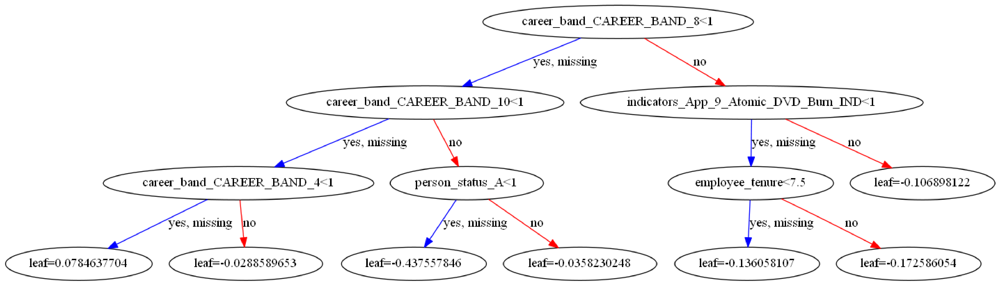

In [59]:
# plottin one of the XGBoost tree
import xgboost as xgb
from xgboost import plot_tree
from matplotlib.pylab import rcParams

##set up the parameters
rcParams['figure.figsize'] = 80,50
# # plot single tree
# plot_tree(xgbmodel ,num_trees=25)
# plt.show()

xgb.plot_tree(xgbmodel,num_trees=20)



Text(0.5, 1.0, 'Feature Importance of XGBoost Model')

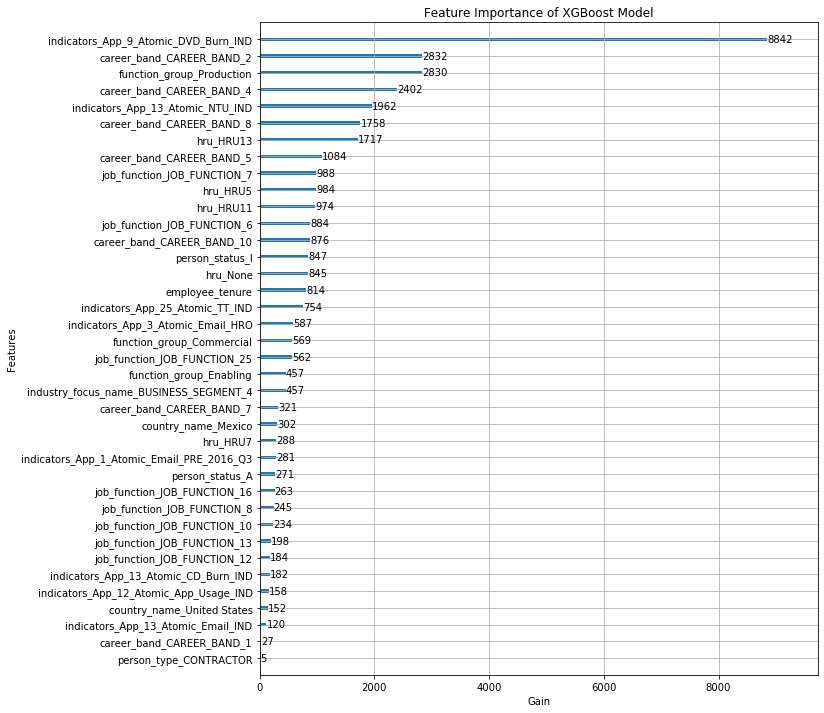

In [60]:

# plot feature importance using built-in function
from xgboost import plot_importance
from matplotlib import pyplot
plt.rcParams["figure.figsize"] = (10, 12)
# plot_importance(xgbmodel,importance_type='gain',max_num_features=20,xlabel ='Gain')
# plt.title('Top 20 Features of XGBoost Model',fontsize=12)
# pyplot.show()


# Get the booster from the xgbmodel
booster = xgbmodel.get_booster()

# Get the importance dictionary (by gain) from the booster
importance = xgbmodel.get_booster().get_score(importance_type="gain")

# make your changes
for key in importance.keys():
    importance[key] = round(importance[key])

# provide the importance dictionary to the plotting function
ax = plot_importance(importance, importance_type='gain', show_values=True,xlabel ='Gain')
plt.title('Feature Importance of XGBoost Model',fontsize=12)

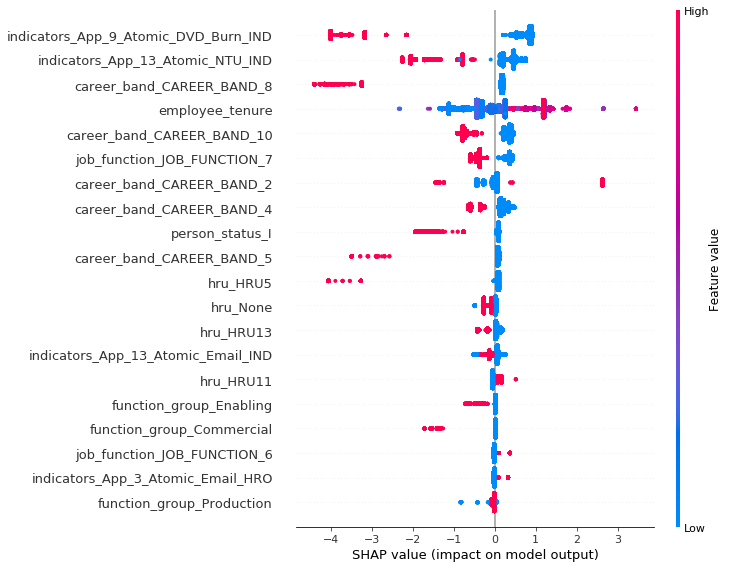

In [64]:
import shap
explainer = shap.TreeExplainer(xgbmodel)
shap_values = explainer.shap_values(smxtrain)

# Plot summary_plot
shap.summary_plot(shap_values,smxtrain)

In [ ]:

# def ABS_SHAP(df_shap,df):
#     #import matplotlib as plt
#     # Make a copy of the input data
#     shap_v = pd.DataFrame(df_shap)
#     feature_list = df.columns
#     shap_v.columns = feature_list
#     df_v = df.copy().reset_index().drop('index',axis=1)
    
#     # Determine the correlation in order to plot with different colors
#     corr_list = list()
#     for i in feature_list:
#         b = np.corrcoef(shap_v[i],df_v[i])[1][0]
#         corr_list.append(b)
#     corr_df = pd.concat([pd.Series(feature_list),pd.Series(corr_list)],axis=1).fillna(0)
#     # Make a data frame. Column 1 is the feature, and Column 2 is the correlation coefficient
#     corr_df.columns  = ['Variable','Corr']
#     corr_df['Sign'] = np.where(corr_df['Corr']>0,'red','blue')
#      # Plot it
#     shap_abs = np.abs(shap_v)
#     k=pd.DataFrame(shap_abs.mean()).reset_index()
#     k.columns = ['Variable','SHAP_abs']
#     k2 = k.merge(corr_df,left_on = 'Variable',right_on='Variable',how='inner')
#     k2 = k2.sort_values(by='SHAP_abs',ascending = True)
#     colorlist = k2['Sign']
#     ax = k2.plot.barh(x='Variable',y='SHAP_abs',color = colorlist, figsize=(5,6),legend=False)
#     ax.set_xlabel("SHAP Value (Red = Positive Impact)")
    
# ABS_SHAP(shap_values,smxtrain) 

In [66]:
# plotting tree
from sklearn.tree import export_graphviz
from IPython import display
estimator = rfmodel.estimators_[1]


import sklearn.tree as tree
import pydotplus
from sklearn.externals.six import StringIO 
from IPython.display import Image
import io
dot_data = StringIO()
tree.export_graphviz(estimator, 
 out_file=dot_data, 
 class_names= ['1','0'], # the target names.
 feature_names=smxtrain.columns, # the feature names.
 filled=True, # Whether to fill in the boxes with colours.
 rounded=True, # Whether to round the corners of the boxes.
)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue()) 
Image(graph.create_png())



In [69]:
import pandas as pd
feature_importances = pd.DataFrame(xgbmodel.feature_importances_,
                                   index = smxtrain.columns,
                                    columns=['importance'])
feature_importances['Predictors'] = smxtrain.columns
feature_importances
feature_importances.sort_values('importance', inplace=True, ascending=False)
feature_importances.head(20)
# feature_importances= feature_importances.sort_values('importance',ascending=False)

,importance,Predictors
indicators_App_9_Atomic_DVD_Burn_IND,0.237329,indicators_App_9_Atomic_DVD_Burn_IND
career_band_CAREER_BAND_2,0.076005,career_band_CAREER_BAND_2
function_group_Production,0.075948,function_group_Production
career_band_CAREER_BAND_4,0.064478,career_band_CAREER_BAND_4
indicators_App_13_Atomic_NTU_IND,0.052671,indicators_App_13_Atomic_NTU_IND
career_band_CAREER_BAND_8,0.047188,career_band_CAREER_BAND_8
hru_HRU13,0.046090,hru_HRU13
career_band_CAREER_BAND_5,0.029092,career_band_CAREER_BAND_5
job_function_JOB_FUNCTION_7,0.026522,job_function_JOB_FUNCTION_7
hru_HRU5,0.026418,hru_HRU5


Text(0.5, 1.0, 'Feature Importance of XGBoost Model for daily alerts')

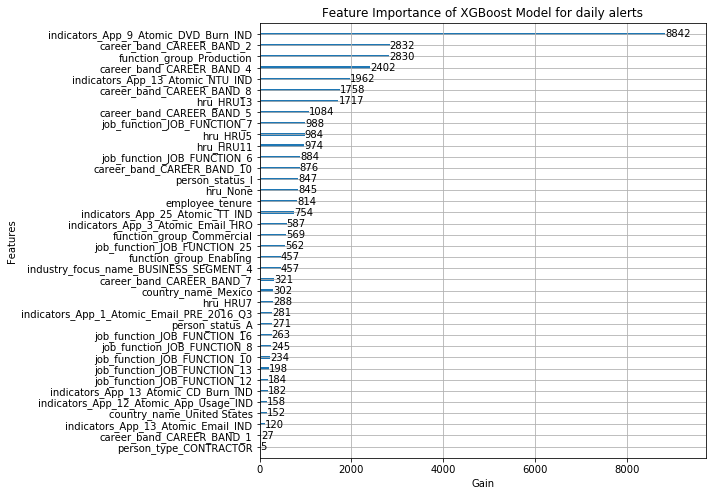

In [78]:

# plot feature importance using built-in function
from xgboost import plot_importance
from matplotlib import pyplot
plt.rcParams["figure.figsize"] = (8, 8)

# Get the booster from the xgbmodel
booster = xgbmodel.get_booster()

# Get the importance dictionary (by gain) from the booster
importance = xgbmodel.get_booster().get_score(importance_type="gain")

# make your changes
for key in importance.keys():
    importance[key] = round(importance[key])

# provide the importance dictionary to the plotting function
ax = plot_importance(importance, importance_type='gain', show_values=True,xlabel ='Gain',max_num_features=40)
plt.title('Feature Importance of XGBoost Model',fontsize=12)

#another method to plot feature importance
plt.figure(figsize=(15, 15))

plt.subplot(2,2,1)
feature_importances['importance'][0:40,].plot(kind='barh')
plt.xlabel('Features', fontsize=12)
plt.ylabel('Importance', fontsize=12)
plt.title('Top 20 Features of XGBoost Model',fontsize=15)
plt.gca().invert_yaxis()

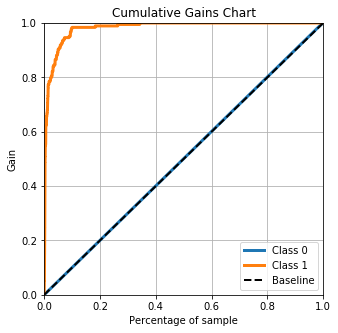

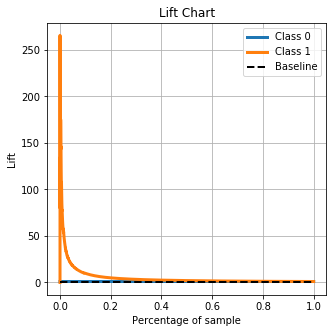

In [89]:
xgb_y_pred = xgbmodel.predict_proba(xtrain)
import scikitplot as skplt

# plt.figure(figsize=(10, 10))
skplt.metrics.plot_cumulative_gain(ytrain, xgb_y_pred,figsize=(5,5))

plt.title('Cumulative Gains Chart',fontsize=12)
plt.show()

skplt.metrics.plot_lift_curve(ytrain, xgb_y_pred,figsize=(5,5))
plt.legend(loc='upper right')
plt.title('Lift Chart',fontsize=12)
plt.show()

In [167]:
#------------------------------------------------
#----Under Sample---------------------------------
#--------------------------------------------------
from imblearn.under_sampling import RandomUnderSampler
print('Before undersampling, the shape of xtrain: {}'.format(xtrain.shape)) 
print('Before undersampling, the shape of ytrain: {}'.format(ytrain.shape)) 
print("Before undersampling, counts of label '1': {}".format(sum(ytrain == 1))) 
print("Before undersampling, counts of label '0': {} \n".format(sum(ytrain == 0))) 
under = RandomUnderSampler(sampling_strategy= 0.01)
uxtrain, uytrain = under.fit_resample(xtrain, ytrain) 

# from sklearn.model_selection import train_test_split
# uxtrain,uytrain,ytrain,ytest = train_test_split(x,y,test_size=0.2)
# uxtrain, uytrain = under.fit_resample(xtrain, ytrain) 
print('After undersampling, the shape of train_X: {}'.format(uxtrain.shape)) 
print('After undersampling, the shape of train_y: {} \n'.format(uytrain.shape)) 
  
print("After undersampling, counts of label '1': {}".format(sum(uytrain == 1))) 
print("After undersampling, counts of label '0': {}".format(sum(uytrain == 0))) 

print('shape of ytest: {} \n'.format(ytest.shape)) 
print("y test counts of label '1': {}".format(sum(ytest == 1))) 
print("ytest, counts of label '0': {}".format(sum(ytest == 0))) 


Before undersampling, the shape of xtrain: (74083, 110)
Before undersampling, the shape of ytrain: (74083,)
Before undersampling, counts of label '1': 181
Before undersampling, counts of label '0': 73902 

After undersampling, the shape of train_X: (18281, 110)
After undersampling, the shape of train_y: (18281,) 

After undersampling, counts of label '1': 181
After undersampling, counts of label '0': 18100
shape of ytest: (18521,) 

y test counts of label '1': 42
ytest, counts of label '0': 18479


In [172]:
uytrain = pd.DataFrame(data=uytrain)
# uytrain.columns

In [173]:
uytrain = pd.DataFrame(data=uytrain)
uytrain.reset_index(drop=True, inplace=True)
uxtrain.reset_index(drop=True, inplace=True)
train_dat = pd.concat([uxtrain,uytrain],axis=1)
train_dat = train_dat.sample(frac=1).reset_index(drop=True)
train_dat.to_csv('train_data_undersample.csv')
uxt=train_dat.drop(columns=['classification_Label'])
uyt = train_dat.classification_Label

In [174]:
uxt=train_dat.drop(columns=['classification_Label'])
uyt = train_dat.classification_Label

In [177]:
#--------------------------------------------
#------logistic model-----------------------
#---------------------------------------------
logreg = LogisticRegression(solver='sag')
logreg.fit(uxt, uyt)

C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='sag', tol=0.0001, verbose=0,
                   warm_start=False)

In [178]:
y_pred = logreg.predict_proba(x)[:,1]
pred = pd.DataFrame(data=y_pred)
pred
threshold_list = [0.5,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,.7,.75,.8,.85,.9,.95,.99]
# threshold_list = np.arange(0.2, 0.3, 0.01)
yact = y
for i in threshold_list:
    print ('\n******** For i = {} ******'.format(i))
    Y_test_pred = pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0','pred:1']
    )
    print(cmtx)
    


******** For i = 0.5 ******
Accuarcy score =0.996825191136452
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.01      0.00      0.01       223

    accuracy                           1.00     92604
   macro avg       0.51      0.50      0.50     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92309      72
true:1     222       1

******** For i = 0.05 ******
Accuarcy score =0.9794825277525809
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     92381
           1       0.07      0.61      0.13       223

    accuracy                           0.98     92604
   macro avg       0.53      0.80      0.56     92604
weighted avg       1.00      0.98      0.99     92604

        pred:0  pred:1
true:0   90567    1814
true:1      86     137

******** For i = 0.1 

C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.00      0.00      0.00       223

    accuracy                           1.00     92604
   macro avg       0.50      0.50      0.50     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92381       0
true:1     223       0

******** For i = 0.85 ******
Accuarcy score =0.9975918966783293
Random Forest Model Accuracy


C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.00      0.00      0.00       223

    accuracy                           1.00     92604
   macro avg       0.50      0.50      0.50     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92381       0
true:1     223       0

******** For i = 0.9 ******
Accuarcy score =0.9975918966783293
Random Forest Model Accuracy


C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.00      0.00      0.00       223

    accuracy                           1.00     92604
   macro avg       0.50      0.50      0.50     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92381       0
true:1     223       0

******** For i = 0.95 ******
Accuarcy score =0.9975918966783293
Random Forest Model Accuracy


C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.00      0.00      0.00       223

    accuracy                           1.00     92604
   macro avg       0.50      0.50      0.50     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92381       0
true:1     223       0

******** For i = 0.99 ******
Accuarcy score =0.9975918966783293
Random Forest Model Accuracy


C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.00      0.00      0.00       223

    accuracy                           1.00     92604
   macro avg       0.50      0.50      0.50     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92381       0
true:1     223       0


In [179]:
#----------------------------------------------
#-------------decision tree-------------------
#---------------------------------------------------
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()

# Train Decision Tree Classifer
dtmodel = dt.fit(uxt, uyt)


In [180]:

#Predict the response for test dataset
dt_y_pred = dtmodel.predict_proba(x)[:,1]
pred = pd.DataFrame(data=dt_y_pred)
pred
threshold_list = [0.5,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]
# threshold_list = np.arange(0.2, 0.4, 0.01)
yact=y
for i in threshold_list:
    print ('\n******** For i = {} ******'.format(i))
    Y_test_pred = pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
    print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0','pred:1']
    )
    print(cmtx)


******** For i = 0.5 ******
Accuarcy score =0.9966956071012051
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.39      0.70      0.50       223

    accuracy                           1.00     92604
   macro avg       0.70      0.85      0.75     92604
weighted avg       1.00      1.00      1.00     92604

[[92142   239]
 [   67   156]]
        pred:0  pred:1
true:0   92142     239
true:1      67     156

******** For i = 0.05 ******
Accuarcy score =0.9865232603343268
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     92381
           1       0.15      0.96      0.25       223

    accuracy                           0.99     92604
   macro avg       0.57      0.97      0.62     92604
weighted avg       1.00      0.99      0.99     92604

[[91143  1238]
 [   10   213]]
        pred:0  pred:1
true:

In [218]:
df = pd.DataFrame(dt_y_pred)
# # clustersDf5.columns = ['cluster_predicted']
# ytest = ytest.reset_index()
dfn = pd.concat([ytest, df], axis = 1)
# dfn = dfn.drop(['index', 'level_0'], axis = 1)

In [219]:
dfn.to_csv('th.csv')

In [181]:
#---------Naive Baye's------
from sklearn.naive_bayes import MultinomialNB
mnb_model = MultinomialNB().fit(uxt, uyt)
#Predict the response for test dataset
pred_mnb_val = mnb_model.predict_proba(x)[:,1]
pred_mnb_val = pd.DataFrame(data=pred_mnb_val)
yact =y

threshold_list = [0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,.7,.75,.8,.85,.9,.95,.99]
for i in threshold_list:
    print ('\n******** For i = {} ******'.format(i))
    Y_test_pred = pred_mnb_val.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0', 'pred:1']
    )
    print(cmtx)
    


******** For i = 0.05 ******
Accuarcy score =0.9318387974601529
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.93      0.96     92381
           1       0.03      0.73      0.05       223

    accuracy                           0.93     92604
   macro avg       0.51      0.83      0.51     92604
weighted avg       1.00      0.93      0.96     92604

        pred:0  pred:1
true:0   86130    6251
true:1      61     162

******** For i = 0.1 ******
Accuarcy score =0.9378860524383396
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.94      0.97     92381
           1       0.03      0.66      0.05       223

    accuracy                           0.94     92604
   macro avg       0.51      0.80      0.51     92604
weighted avg       1.00      0.94      0.97     92604

        pred:0  pred:1
true:0   86704    5677
true:1      75     148

******** For i = 0.1

        pred:0  pred:1
true:0   91155    1226
true:1     156      67

******** For i = 0.9 ******
Accuarcy score =0.9887369876031273
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     92381
           1       0.07      0.29      0.11       223

    accuracy                           0.99     92604
   macro avg       0.53      0.64      0.55     92604
weighted avg       1.00      0.99      0.99     92604

        pred:0  pred:1
true:0   91497     884
true:1     159      64

******** For i = 0.95 ******
Accuarcy score =0.9900544252948037
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     92381
           1       0.08      0.29      0.12       223

    accuracy                           0.99     92604
   macro avg       0.54      0.64      0.56     92604
weighted avg       1.00      0.99      0.99     92604

        pred:0  pred:

In [184]:
#----------------------------------------------
#-------------Random Forest-------------------
#---------------------------------------------------
rf = RandomForestClassifier(n_estimators = 100)
# Train random forest Classifer
rfmodel = rf.fit(uxt, uyt)

In [186]:
#----------------------------------------------
#-------------Random Forest-------------------
#---------------------------------------------------
rf = RandomForestClassifier(n_estimators = 100)
# Train random forest Classifer
rfmodel = rf.fit(uxt, uyt)
#Predict the response for test dataset
rf_y_pred = rfmodel.predict_proba(x)[:,1]
rf_y_pred = pd.DataFrame(data=rf_y_pred)

yact =y
threshold_list = [0.5,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]
for i in threshold_list:
    print ('\n******** For i = {} ******'.format(i))
    Y_test_pred = rf_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0', 'pred:1']
    )
    print(cmtx)


******** For i = 0.5 ******
Accuarcy score =0.9965660230659583
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.39      0.74      0.51       223

    accuracy                           1.00     92604
   macro avg       0.69      0.87      0.75     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92120     261
true:1      57     166

******** For i = 0.05 ******
Accuarcy score =0.9831540754179086
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     92381
           1       0.12      0.96      0.22       223

    accuracy                           0.98     92604
   macro avg       0.56      0.97      0.60     92604
weighted avg       1.00      0.98      0.99     92604

        pred:0  pred:1
true:0   90829    1552
true:1       8     215

******** For i = 0.1

In [189]:
#-------------XGBoost-------------
# libaries for GBM
from xgboost import XGBClassifier
xgb = XGBClassifier()

# Train Random Forest Tree Classifer
xgbmodel = xgb.fit(uxtrain, uytrain)
#-------------XGBoost-------------
#Predict the response for test dataset
xgb_y_pred = xgbmodel.predict_proba(x)[:,1]
xgb_y_pred = pd.DataFrame(data=xgb_y_pred)

yact =y
threshold_list = [0.5]
for i in threshold_list:
    print ('\n******** For Threshold = {} ******'.format(i))
    Y_test_pred = xgb_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Gradient Boost Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0','pred:1']
    )
    print(cmtx)

C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\preprocessing\_label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\preprocessing\_label.py:268: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)



******** For Threshold = 0.5 ******
Accuarcy score =0.9971167552157574
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.41      0.43      0.42       223

    accuracy                           1.00     92604
   macro avg       0.70      0.72      0.71     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92240     141
true:1     126      97


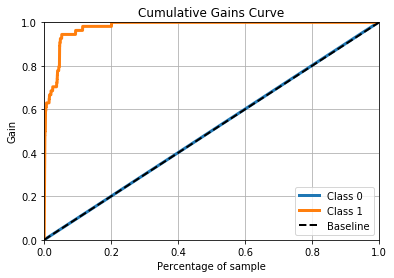

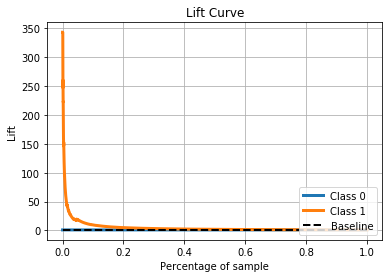

In [56]:
xgb_y_pred = xgbmodel.predict_proba(xtest)
# plotLiftChart(y, xgb_y_pred)
# xgb_y_pred = pd.DataFrame(data=xgb_y_pred)
import scikitplot as skplt

skplt.metrics.plot_cumulative_gain(ytest, xgb_y_pred)

plt.show()

skplt.metrics.plot_lift_curve(ytest, xgb_y_pred)
plt.show()

In [190]:
#-----------------------------------------------------
#---------------over and under sampling--------------------
#----------------------------------------------------------
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
over = SMOTE(sampling_strategy=0.1)
under = RandomUnderSampler(sampling_strategy=0.1)
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)
# transform the dataset

xsamp, ysamp = pipeline.fit_resample(xtrain, ytrain)

from collections import Counter
from numpy import where
counter = Counter(ysamp)
print(counter)
# # scatter plot of examples by class label
# for label, _ in counter.items():
# 	row_ix = where(ysamp == label)[0]
# 	plt.scatter(xsamp[row_ix, 0], xsamp[row_ix, 1], label=str(label))
# plt.legend()
# plt.show()

Counter({0: 73900, 1: 7390})


In [191]:
#--------------------------------------------
#------logistic model-----------------------
#---------------------------------------------
logreg = LogisticRegression(solver='sag')
logreg.fit(xsamp, ysamp)


C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\linear_model\_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='sag', tol=0.0001, verbose=0,
                   warm_start=False)

In [197]:
y_pred = logreg.predict_proba(x)[:,1]
pred = pd.DataFrame(data=y_pred)
pred
threshold_list = [0.5,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,.7,.75,.8,.85,.9,.95,.99]
# threshold_list = np.arange(0.2, 0.3, 0.01)
yact = y
for i in threshold_list:
    print ('\n******** For i = {} ******'.format(i))
    Y_test_pred = pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0','pred:1']
    )
    print(cmtx)
    


******** For i = 0.5 ******
Accuarcy score =0.9907347414798496
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     92381
           1       0.14      0.57      0.23       223

    accuracy                           0.99     92604
   macro avg       0.57      0.78      0.61     92604
weighted avg       1.00      0.99      0.99     92604

        pred:0  pred:1
true:0   91619     762
true:1      96     127

******** For i = 0.05 ******
Accuarcy score =0.9367737894691374
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.94      0.97     92381
           1       0.03      0.89      0.06       223

    accuracy                           0.94     92604
   macro avg       0.52      0.91      0.52     92604
weighted avg       1.00      0.94      0.97     92604

        pred:0  pred:1
true:0   86550    5831
true:1      24     199

******** For i = 0.1

        pred:0  pred:1
true:0   92059     322
true:1     122     101

******** For i = 0.85 ******
Accuarcy score =0.9952485853742818
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.24      0.45      0.31       223

    accuracy                           1.00     92604
   macro avg       0.62      0.72      0.66     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92064     317
true:1     123     100

******** For i = 0.9 ******
Accuarcy score =0.9953565720703209
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.25      0.45      0.32       223

    accuracy                           1.00     92604
   macro avg       0.62      0.72      0.66     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:

In [194]:
#----------------------------------------------
#-------------decision tree-------------------
#---------------------------------------------------
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()

# Train Decision Tree Classifer
dtmodel = dt.fit(xsamp, ysamp)

In [195]:
y_pred = dtmodel.predict_proba(x)[:,1]
pred = pd.DataFrame(data=y_pred)
pred
threshold_list = [0.5,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,.7,.75,.8,.85,.9,.95,.99]
# threshold_list = np.arange(0.2, 0.3, 0.01)
yact = y
for i in threshold_list:
    print ('\n******** For i = {} ******'.format(i))
    Y_test_pred = pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0','pred:1']
    )
    print(cmtx)
    


******** For i = 0.5 ******
Accuarcy score =0.9957777201848732
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.33      0.76      0.46       223

    accuracy                           1.00     92604
   macro avg       0.67      0.88      0.73     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92044     337
true:1      54     169

******** For i = 0.05 ******
Accuarcy score =0.9908643255150965
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     92381
           1       0.20      0.93      0.33       223

    accuracy                           0.99     92604
   macro avg       0.60      0.96      0.66     92604
weighted avg       1.00      0.99      0.99     92604

        pred:0  pred:1
true:0   91551     830
true:1      16     207

******** For i = 0.1

        pred:0  pred:1
true:0   92158     223
true:1      69     154

******** For i = 0.85 ******
Accuarcy score =0.9968575871452637
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.41      0.68      0.51       223

    accuracy                           1.00     92604
   macro avg       0.70      0.84      0.75     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92161     220
true:1      71     152

******** For i = 0.9 ******
Accuarcy score =0.9969979698501145
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.42      0.64      0.51       223

    accuracy                           1.00     92604
   macro avg       0.71      0.82      0.75     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:

In [196]:
#---------Naive Baye's------
from sklearn.naive_bayes import MultinomialNB
mnb_model = MultinomialNB().fit(xsamp, ysamp)
#Predict the response for test dataset
pred_mnb_val = mnb_model.predict_proba(x)[:,1]
pred_mnb_val = pd.DataFrame(data=pred_mnb_val)
yact =y

threshold_list = [0.5,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,.7,.75,.8,.85,.9,.95,.99]
for i in threshold_list:
    print ('\n******** For i = {} ******'.format(i))
    Y_test_pred = pred_mnb_val.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0', 'pred:1']
    )
    print(cmtx)


******** For i = 0.5 ******
Accuarcy score =0.9557146559543864
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.96      0.98     92381
           1       0.03      0.62      0.06       223

    accuracy                           0.96     92604
   macro avg       0.52      0.79      0.52     92604
weighted avg       1.00      0.96      0.98     92604

        pred:0  pred:1
true:0   88365    4016
true:1      85     138

******** For i = 0.05 ******
Accuarcy score =0.9161591291952832
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.92      0.96     92381
           1       0.02      0.82      0.04       223

    accuracy                           0.92     92604
   macro avg       0.51      0.87      0.50     92604
weighted avg       1.00      0.92      0.95     92604

        pred:0  pred:1
true:0   84658    7723
true:1      41     182

******** For i = 0.1

        pred:0  pred:1
true:0   90306    2075
true:1     144      79

******** For i = 0.85 ******
Accuarcy score =0.9845363051272084
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     92381
           1       0.06      0.35      0.10       223

    accuracy                           0.98     92604
   macro avg       0.53      0.67      0.55     92604
weighted avg       1.00      0.98      0.99     92604

        pred:0  pred:1
true:0   91093    1288
true:1     144      79

******** For i = 0.9 ******
Accuarcy score =0.9856269707572027
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     92381
           1       0.06      0.35      0.10       223

    accuracy                           0.99     92604
   macro avg       0.53      0.67      0.55     92604
weighted avg       1.00      0.99      0.99     92604

        pred:0  pred:

In [199]:
#----------------------------------------------
#-------------Random Forest-------------------
#---------------------------------------------------
rf = RandomForestClassifier(n_estimators = 100)
# Train random forest Classifer
rfmodel = rf.fit(xsamp, ysamp)
#Predict the response for test dataset
rf_y_pred = rfmodel.predict_proba(x)[:,1]
rf_y_pred = pd.DataFrame(data=rf_y_pred)

yact =y
threshold_list = [0.5,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]
for i in threshold_list:
    print ('\n******** For i = {} ******'.format(i))
    Y_test_pred = rf_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0', 'pred:1']
    )
    print(cmtx)


******** For i = 0.5 ******
Accuarcy score =0.9958533108721006
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.34      0.78      0.48       223

    accuracy                           1.00     92604
   macro avg       0.67      0.89      0.74     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92046     335
true:1      49     174

******** For i = 0.05 ******
Accuarcy score =0.9896332771802514
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     92381
           1       0.18      0.94      0.30       223

    accuracy                           0.99     92604
   macro avg       0.59      0.96      0.65     92604
weighted avg       1.00      0.99      0.99     92604

        pred:0  pred:1
true:0   91435     946
true:1      14     209

******** For i = 0.1

In [198]:
#-------------XGBoost-------------
# libaries for GBM
from xgboost import XGBClassifier
xgb = XGBClassifier()

# Train Random Forest Tree Classifer
xgbmodel = xgb.fit(xsamp, ysamp)
#-------------XGBoost-------------
#Predict the response for test dataset
xgb_y_pred = xgbmodel.predict_proba(x)[:,1]
xgb_y_pred = pd.DataFrame(data=xgb_y_pred)

yact =y
threshold_list = [0.5,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,.7,.75,.8,.85,.9,.95,.99]
for i in threshold_list:
    print ('\n******** For Threshold = {} ******'.format(i))
    Y_test_pred = xgb_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Gradient Boost Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0','pred:1']
    )
    print(cmtx)


******** For Threshold = 0.5 ******
Accuarcy score =0.9946006651980476
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.25      0.61      0.35       223

    accuracy                           0.99     92604
   macro avg       0.62      0.80      0.68     92604
weighted avg       1.00      0.99      1.00     92604

        pred:0  pred:1
true:0   91967     414
true:1      86     137

******** For Threshold = 0.05 ******
Accuarcy score =0.9105222236620448
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.91      0.95     92381
           1       0.02      0.93      0.05       223

    accuracy                           0.91     92604
   macro avg       0.51      0.92      0.50     92604
weighted avg       1.00      0.91      0.95     92604

        pred:0  pred:1
true:0   84110    8271
true:1      15     208

**

        pred:0  pred:1
true:0   92243     138
true:1     123     100

******** For Threshold = 0.85 ******
Accuarcy score =0.9971815472333808
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.42      0.43      0.43       223

    accuracy                           1.00     92604
   macro avg       0.71      0.72      0.71     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92246     135
true:1     126      97

******** For Threshold = 0.9 ******
Accuarcy score =0.9971923459029848
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.42      0.43      0.43       223

    accuracy                           1.00     92604
   macro avg       0.71      0.72      0.71     92604
weighted avg       1.00      1.00      1.00     92604

   

C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     92381
           1       0.00      0.00      0.00       223

    accuracy                           1.00     92604
   macro avg       0.50      0.50      0.50     92604
weighted avg       1.00      1.00      1.00     92604

        pred:0  pred:1
true:0   92381       0
true:1     223       0


In [95]:
#-------------------------------------------------------------------------------------------------------------------------------
#----------------------------------------Notable Risks (TP/HIGH and TP/LOW) ----------------------------------------------------
#-------------------------------------------------------------------------------------------------------------------------------
mod_data = atomic_model_final_data

mod_data['classification_Label'] = mod_data['classification'].apply(lambda x: 1 if x =='TP/HIGH' or x == 'TP/LOW' else 0)
mod_data = mod_data.drop(columns=['owner_name'])
mod_data =pd.get_dummies( mod_data, columns = ['indicators',
'hru',
'career_band',
'job_function',
'function_group',
'industry_focus_name',
'person_type',
'person_status',
'country_name',] )

# extracting predictors and target variable
x= mod_data.drop(columns=['classification','classification_Label'])
y= mod_data.classification_Label
x

,employee_tenure,indicators_App_12_Atomic_App_Usage_IND,indicators_App_13_Atomic_CD_Burn_IND,indicators_App_13_Atomic_DVD_Burn_IND,indicators_App_13_Atomic_Email_IND,indicators_App_13_Atomic_NTU_IND,indicators_App_13_Heat_USB_IND,indicators_App_1_Atomic_Email_2016_Q3,indicators_App_1_Atomic_Email_PRE_2016_Q3,indicators_App_1_Heat_USB_PRE_2016_Q3,...,country_name_Mexico,country_name_No_Data,country_name_Poland,country_name_Singapore,country_name_Sweden,"country_name_Taiwan, Province of China",country_name_Turkey,country_name_United Arab Emirates,country_name_United Kingdom,country_name_United States
0,14.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,14.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,14.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,14.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,14.0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132038,4.0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
132039,4.0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
132040,4.0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
132041,4.0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [96]:
mod_data['classification_Label'].value_counts()

0    89679
1     2925
Name: classification_Label, dtype: int64

In [97]:
# splitting the data into train and test
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size=0.2)
xtrain.head(2)

,employee_tenure,indicators_App_12_Atomic_App_Usage_IND,indicators_App_13_Atomic_CD_Burn_IND,indicators_App_13_Atomic_DVD_Burn_IND,indicators_App_13_Atomic_Email_IND,indicators_App_13_Atomic_NTU_IND,indicators_App_13_Heat_USB_IND,indicators_App_1_Atomic_Email_2016_Q3,indicators_App_1_Atomic_Email_PRE_2016_Q3,indicators_App_1_Heat_USB_PRE_2016_Q3,...,country_name_Mexico,country_name_No_Data,country_name_Poland,country_name_Singapore,country_name_Sweden,"country_name_Taiwan, Province of China",country_name_Turkey,country_name_United Arab Emirates,country_name_United Kingdom,country_name_United States
106199,7.0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
45698,34.0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [98]:
#--------------------------------------------
#------logistic model-----------------------
#---------------------------------------------
logreg = LogisticRegression(solver='sag')
logreg.fit(xtrain, ytrain)
y_pred = logreg.predict(xtest)


# predicting the data
ypredtrain=logreg.predict(x)
pred = pd.DataFrame(data=ypredtrain)
pred

print('Accuarcy score ='+str(accuracy_score(y, pred)))
print('Random Forest Model Accuracy')
print(classification_report(y, pred))

# building confusuion matrix
cmtx = pd.DataFrame(confusion_matrix(y, pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0', 'pred:1']
)
print(cmtx)

The max_iter was reached which means the coef_ did not converge


Accuarcy score =0.9756274027039868
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     89679
           1       0.62      0.61      0.61      2925

    accuracy                           0.98     92604
   macro avg       0.80      0.80      0.80     92604
weighted avg       0.98      0.98      0.98     92604

        pred:0  pred:1
true:0   88564    1115
true:1    1142    1783


In [99]:
#----------------------------------------------
#-------------decision tree-------------------
#---------------------------------------------------
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()

# Train Decision Tree Classifer
dtmodel = dt.fit(xtrain, ytrain)

#Predict the response for test dataset
dt_y_pred = dtmodel.predict_proba(x)[:,1]
dt_y_pred = pd.DataFrame(data=dt_y_pred)
yact =y
# chaning the threshold and analysing the count of TP/High
threshold_list = [0.5,0.45,0.4,0.35,0.3,0.25,0.2,0.15,0.1,0.08,0.07,.06,.05,.04,.03,.02,.01]
for i in threshold_list:
    print ('\n******** For Probablity Threshold = {} ******'.format(i))
    Y_test_pred = dt_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Decision Tree Model Accuracy')
    print(classification_report(yact, Y_test_pred))
    print(confusion_matrix(yact, Y_test_pred))


******** For Probablity Threshold = 0.5 ******
Accuarcy score =0.9793853397261457
Decision Tree Model Accuracy
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     89679
           1       0.68      0.66      0.67      2925

    accuracy                           0.98     92604
   macro avg       0.83      0.83      0.83     92604
weighted avg       0.98      0.98      0.98     92604

[[88762   917]
 [  992  1933]]

******** For Probablity Threshold = 0.45 ******
Accuarcy score =0.9792881516997106
Decision Tree Model Accuracy
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     89679
           1       0.65      0.76      0.70      2925

    accuracy                           0.98     92604
   macro avg       0.82      0.87      0.84     92604
weighted avg       0.98      0.98      0.98     92604

[[88472  1207]
 [  711  2214]]

******** For Probablity Threshold = 0.4 ******
Accuarcy sc

In [100]:
#---------Naive Baye's------
from sklearn.naive_bayes import MultinomialNB
mnb_model = MultinomialNB().fit(xtrain, ytrain)

print('**********************Prediction on Test Data*************************** ')

y_pred = mnb_model.predict_proba(xtest)[:,1]
pred = pd.DataFrame(data=y_pred)
pred
yact = ytest
threshold_list = [0.5,0.45,0.4,0.35,0.3,0.25,0.2,0.15,0.1,0.08,0.07,.06,.05,.04,.03,.02,.01]
for i in threshold_list:
    print ('\n******** For Probablity Threshold = {} ******'.format(i))
    Y_test_pred = pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Naive Bayes Model Accuracy')
    print(classification_report(yact, Y_test_pred))
    print(confusion_matrix(yact, Y_test_pred))
    
print('**********************Prediction on Test Data*************************** ')

print('********************** End Prediction on the whole Data set *************************** ')
y_pred = mnb_model.predict_proba(x)[:,1]
pred = pd.DataFrame(data=y_pred)
pred
yact =y
threshold_list = [0.5,0.45,0.4,0.35,0.3,0.25,0.2,0.15,0.1,0.08,0.07,.06,.05,.04,.03,.02,.01]
for i in threshold_list:
    print ('\n******** For Probablity Threshold = {} ******'.format(i))
    Y_test_pred = pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Naive Bayes Model Accuracy')
    print(classification_report(yact, Y_test_pred))
    print(confusion_matrix(yact, Y_test_pred))
print('********************** Start Prediction on the whole Data set *************************** ')


**********************Prediction on Test Data*************************** 

******** For Probablity Threshold = 0.5 ******
Accuarcy score =0.9601533394525134
Naive Bayes Model Accuracy
              precision    recall  f1-score   support

           0       0.99      0.97      0.98     17961
           1       0.40      0.67      0.50       560

    accuracy                           0.96     18521
   macro avg       0.70      0.82      0.74     18521
weighted avg       0.97      0.96      0.96     18521

[[17410   551]
 [  187   373]]

******** For Probablity Threshold = 0.45 ******
Accuarcy score =0.9522164030019977
Naive Bayes Model Accuracy
              precision    recall  f1-score   support

           0       0.99      0.96      0.98     17961
           1       0.35      0.67      0.46       560

    accuracy                           0.95     18521
   macro avg       0.67      0.82      0.72     18521
weighted avg       0.97      0.95      0.96     18521

[[17260   701]
 [  1


******** For i = 0.05 ******
Accuarcy score =0.9345600622003369
Naive Bayes Model Accuracy
              precision    recall  f1-score   support

           0       0.99      0.94      0.97     89679
           1       0.28      0.71      0.41      2925

    accuracy                           0.93     92604
   macro avg       0.64      0.82      0.69     92604
weighted avg       0.97      0.93      0.95     92604

[[84478  5201]
 [  859  2066]]

******** For i = 0.1 ******
Accuarcy score =0.9397866182886269
Naive Bayes Model Accuracy
              precision    recall  f1-score   support

           0       0.99      0.95      0.97     89679
           1       0.30      0.70      0.42      2925

    accuracy                           0.94     92604
   macro avg       0.65      0.82      0.70     92604
weighted avg       0.97      0.94      0.95     92604

[[84993  4686]
 [  890  2035]]

******** For i = 0.15 ******
Accuarcy score =0.9419031575309922
Naive Bayes Model Accuracy
         

              precision    recall  f1-score   support

           0       0.99      0.98      0.98     89679
           1       0.51      0.57      0.54      2925

    accuracy                           0.97     92604
   macro avg       0.75      0.78      0.76     92604
weighted avg       0.97      0.97      0.97     92604

[[88079  1600]
 [ 1264  1661]]
********************** Start Prediction on the whole Data set *************************** 


In [101]:
#----------------------------------------------
#-------------Random Forest-------------------
#---------------------------------------------------
rf = RandomForestClassifier(n_estimators=100)
# Train Random Forest Tree Classifer
rfmodel = rf.fit(xtrain, ytrain)

#Predict the response for test dataset
rf_y_pred = rfmodel.predict_proba(xtest)[:,1]

#Predict the response for the whole dataset
rf_y_pred = rfmodel.predict_proba(x)[:,1]
rf_y_pred = pd.DataFrame(data=rf_y_pred)

yact =y
threshold_list = [0.5,0.45,0.4,0.35,0.3,0.25,0.2,0.15,0.1,0.08,0.07,.06,.05,.04,.03,.02,.01]
for i in threshold_list:
    print ('\n******** For Probablity Threshold = {} ******'.format(i))
    Y_test_pred = rf_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
    print(confusion_matrix(yact, Y_test_pred))



******** For Probablity Threshold = 0.5 ******
Accuarcy score =0.9794069370653535
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     89679
           1       0.68      0.66      0.67      2925

    accuracy                           0.98     92604
   macro avg       0.83      0.83      0.83     92604
weighted avg       0.98      0.98      0.98     92604

[[88753   926]
 [  981  1944]]

******** For Probablity Threshold = 0.45 ******
Accuarcy score =0.9792557556908988
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     89679
           1       0.65      0.76      0.70      2925

    accuracy                           0.98     92604
   macro avg       0.82      0.87      0.84     92604
weighted avg       0.98      0.98      0.98     92604

[[88471  1208]
 [  713  2212]]

******** For Probablity Threshold = 0.4 ******
Accuarcy sc

In [102]:
#-----------------------------------OVERSAMPLING--------------------------------------------------------------------------------

print('Before OverSampling, the shape of train_X: {}'.format(xtrain.shape)) 
print('Before OverSampling, the shape of train_y: {} \n'.format(ytrain.shape)) 
print("Before OverSampling, counts of label '1': {}".format(sum(ytrain == 1))) 
print("Before OverSampling, counts of label '0': {} \n".format(sum(ytrain == 0))) 
print("Before OverSampling, counts of label '1' in test: {}".format(sum(ytest == 1))) 
print("Before OverSampling, counts of label '0' in test: {} \n".format(sum(ytest == 0))) 
sm = SMOTE(random_state = 2) 
smxtrain, smytrain = sm.fit_sample(xtrain, ytrain.ravel()) 
  
print('After OverSampling, the shape of train_X: {}'.format(smxtrain.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(smytrain.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(smytrain == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(smytrain == 0))) 

Before OverSampling, the shape of train_X: (74083, 110)
Before OverSampling, the shape of train_y: (74083,) 

Before OverSampling, counts of label '1': 2365
Before OverSampling, counts of label '0': 71718 

Before OverSampling, counts of label '1' in test: 560
Before OverSampling, counts of label '0' in test: 17961 

After OverSampling, the shape of train_X: (143436, 110)
After OverSampling, the shape of train_y: (143436,) 

After OverSampling, counts of label '1': 71718
After OverSampling, counts of label '0': 71718


In [ ]:
#----------------------------------------------
#-------------Random Forest-------------------
#---------------------------------------------------
rf = RandomForestClassifier(n_estimators=100)
# Train Random Forest Tree Classifer
rfmodel = rf.fit(smxtrain, smytrain)


In [104]:
# Predict the response for test dataset
rf_y_pred = rfmodel.predict_proba(xtest)[:,1]

# Predict the response for the whole dataset
rf_y_pred = rfmodel.predict_proba(x)[:,1]
rf_y_pred = pd.DataFrame(data=rf_y_pred)
yact =y
threshold_list = [0.5,0.45,0.4,0.35,0.3,0.25,0.2,0.15,0.1,0.08,0.07,.06,.05,.04,.03,.02,.01]
for i in threshold_list:
    print ('\n******** For Probablity Threshold = {} ******'.format(i))
    Y_test_pred = rf_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Random Forest Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))

    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0','pred:1']
    )
    print(cmtx)


******** For Probablity Threshold = 0.5 ******
Accuarcy score =0.9609304133730724
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.96      0.98     89679
           1       0.44      0.92      0.60      2925

    accuracy                           0.96     92604
   macro avg       0.72      0.94      0.79     92604
weighted avg       0.98      0.96      0.97     92604

        pred:0  pred:1
true:0   86303    3376
true:1     242    2683

******** For Probablity Threshold = 0.45 ******
Accuarcy score =0.9595589823333766
Random Forest Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.96      0.98     89679
           1       0.43      0.92      0.59      2925

    accuracy                           0.96     92604
   macro avg       0.72      0.94      0.78     92604
weighted avg       0.98      0.96      0.97     92604

        pred:0  pred:1
true:0   86162    3517
true:1

              precision    recall  f1-score   support

           0       1.00      0.82      0.90     89679
           1       0.15      1.00      0.27      2925

    accuracy                           0.83     92604
   macro avg       0.58      0.91      0.58     92604
weighted avg       0.97      0.83      0.88     92604

        pred:0  pred:1
true:0   73726   15953
true:1      12    2913


In [213]:
#-------------XGBoost-------------
# libaries for GBM
from xgboost import XGBClassifier
xgb = XGBClassifier(n_estimators=100)

# Train Random Forest Tree Classifer
xgbmodel = xgb.fit(smxtrain, smytrain)
#-------------XGBoost-------------
#Predict the response for test dataset
xgb_y_pred = xgbmodel.predict_proba(x)[:,1]
xgb_y_pred = pd.DataFrame(data=xgb_y_pred)

yact =y
k=-1
threshold_list = [0.5,0.45,0.4,0.35,0.3,0.25,0.2,0.15,0.1,0.08,0.07,.06,.05,.04,.03,.02,.01]
for i in threshold_list:
    k=k+1
    print ('\n******** For Probablity Threshold = {} ******'.format(i))
    Y_test_pred = xgb_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Gradient Boost Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0','pred:1']
    )
    


******** For Probablity Threshold = 0.5 ******
Accuarcy score =0.9121636214418384
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.91      0.95     89679
           1       0.25      0.92      0.40      2925

    accuracy                           0.91     92604
   macro avg       0.63      0.92      0.68     92604
weighted avg       0.97      0.91      0.94     92604

        pred:0  pred:1
true:0   81770    7909
true:1     225    2700

******** For Probablity Threshold = 0.45 ******
Accuarcy score =0.9087296445077966
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.91      0.95     89679
           1       0.25      0.93      0.39      2925

    accuracy                           0.91     92604
   macro avg       0.62      0.92      0.67     92604
weighted avg       0.97      0.91      0.93     92604

        pred:0  pred:1
true:0   81431    8248
true

              precision    recall  f1-score   support

           0       1.00      0.20      0.34     89679
           1       0.04      1.00      0.08      2925

    accuracy                           0.23     92604
   macro avg       0.52      0.60      0.21     92604
weighted avg       0.97      0.23      0.33     92604

        pred:0  pred:1
true:0   18366   71313
true:1       0    2925


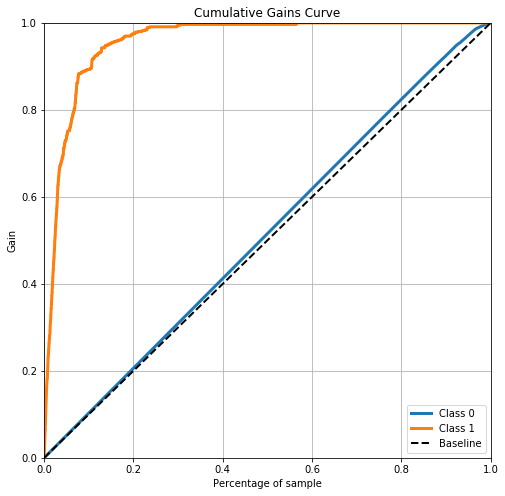

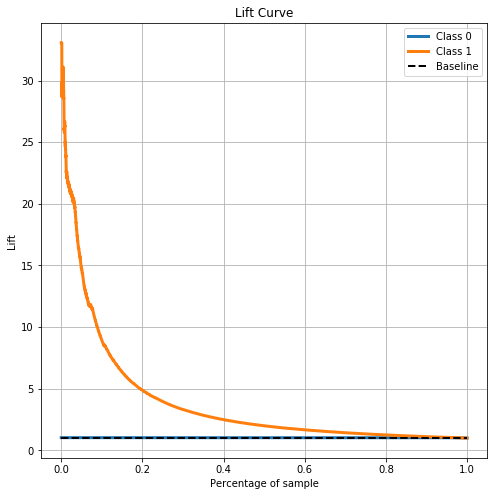

In [111]:
xgb_y_pred = xgbmodel.predict_proba(xtest)
# plotLiftChart(y, xgb_y_pred)
# xgb_y_pred = pd.DataFrame(data=xgb_y_pred)
import scikitplot as skplt


# plt.subplot(2,2,1)
skplt.metrics.plot_cumulative_gain(ytest, xgb_y_pred)

plt.show()

skplt.metrics.plot_lift_curve(ytest, xgb_y_pred)
plt.legend(loc='upper right')
plt.show()

In [ ]:
#------------------------------------------------
#----Under Sample---------------------------------
#--------------------------------------------------
from imblearn.under_sampling import RandomUnderSampler
print('Before undersampling, the shape of xtrain: {}'.format(xtrain.shape)) 
print('Before undersampling, the shape of ytrain: {}'.format(ytrain.shape)) 
print("Before undersampling, counts of label '1': {}".format(sum(ytrain == 1))) 
print("Before undersampling, counts of label '0': {} \n".format(sum(ytrain == 0))) 
under = RandomUnderSampler(sampling_strategy= 0.01)
uxtrain, uytrain = under.fit_resample(xtrain, ytrain) 

# from sklearn.model_selection import train_test_split
# uxtrain,uytrain,ytrain,ytest = train_test_split(x,y,test_size=0.2)
# uxtrain, uytrain = under.fit_resample(xtrain, ytrain) 
print('After undersampling, the shape of train_X: {}'.format(uxtrain.shape)) 
print('After undersampling, the shape of train_y: {} \n'.format(uytrain.shape)) 
  
print("After undersampling, counts of label '1': {}".format(sum(uytrain == 1))) 
print("After undersampling, counts of label '0': {}".format(sum(uytrain == 0))) 

print('shape of ytest: {} \n'.format(ytest.shape)) 
print("y test counts of label '1': {}".format(sum(ytest == 1))) 
print("ytest, counts of label '0': {}".format(sum(ytest == 0))) 


In [208]:
uytrain = pd.DataFrame(data=uytrain)
uytrain.reset_index(drop=True, inplace=True)
uxtrain.reset_index(drop=True, inplace=True)
train_dat = pd.concat([uxtrain,uytrain],axis=1)
train_dat = train_dat.sample(frac=1).reset_index(drop=True)
train_dat.to_csv('train_data_undersample.csv')
uxt=train_dat.drop(columns=['classification_Label'])
uyt = train_dat.classification_Label

In [209]:
#-------------XGBoost-------------
# libaries for GBM
from xgboost import XGBClassifier
xgb = XGBClassifier()

# Train Random Forest Tree Classifer
xgbmodel = xgb.fit(uxt, uyt)
#-------------XGBoost-------------
#Predict the response for test dataset
xgb_y_pred = xgbmodel.predict_proba(x)[:,1]
xgb_y_pred = pd.DataFrame(data=xgb_y_pred)

yact =y
threshold_list = [0.5,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,.7,.75,.8,.85,.9,.95,.99]
for i in threshold_list:
    print ('\n******** For Threshold = {} ******'.format(i))
    Y_test_pred = xgb_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Gradient Boost Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0','pred:1']
    )
    print(cmtx)


******** For Threshold = 0.5 ******
Accuarcy score =0.9706600146861907
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       0.97      1.00      0.99     89679
           1       0.94      0.08      0.14      2925

    accuracy                           0.97     92604
   macro avg       0.95      0.54      0.56     92604
weighted avg       0.97      0.97      0.96     92604

        pred:0  pred:1
true:0   89664      15
true:1    2702     223

******** For Threshold = 0.05 ******
Accuarcy score =0.9603256878752537
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     89679
           1       0.30      0.18      0.23      2925

    accuracy                           0.96     92604
   macro avg       0.63      0.59      0.60     92604
weighted avg       0.95      0.96      0.96     92604

        pred:0  pred:1
true:0   88389    1290
true:1    2384     541

**

        pred:0  pred:1
true:0   89673       6
true:1    2882      43

******** For Threshold = 0.85 ******
Accuarcy score =0.968813442183923
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       0.97      1.00      0.98     89679
           1       0.88      0.01      0.03      2925

    accuracy                           0.97     92604
   macro avg       0.92      0.51      0.51     92604
weighted avg       0.97      0.97      0.95     92604

        pred:0  pred:1
true:0   89673       6
true:1    2882      43

******** For Threshold = 0.9 ******
Accuarcy score =0.9684138914085785
Gradient Boost Model Accuracy


C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.97      1.00      0.98     89679
           1       0.00      0.00      0.00      2925

    accuracy                           0.97     92604
   macro avg       0.48      0.50      0.49     92604
weighted avg       0.94      0.97      0.95     92604

        pred:0  pred:1
true:0   89679       0
true:1    2925       0

******** For Threshold = 0.95 ******
Accuarcy score =0.9684138914085785
Gradient Boost Model Accuracy


C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.97      1.00      0.98     89679
           1       0.00      0.00      0.00      2925

    accuracy                           0.97     92604
   macro avg       0.48      0.50      0.49     92604
weighted avg       0.94      0.97      0.95     92604

        pred:0  pred:1
true:0   89679       0
true:1    2925       0

******** For Threshold = 0.99 ******
Accuarcy score =0.9684138914085785
Gradient Boost Model Accuracy


C:\Users\shwet\Anaconda3\envs\py36\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.97      1.00      0.98     89679
           1       0.00      0.00      0.00      2925

    accuracy                           0.97     92604
   macro avg       0.48      0.50      0.49     92604
weighted avg       0.94      0.97      0.95     92604

        pred:0  pred:1
true:0   89679       0
true:1    2925       0


In [143]:
#Predict the response for test dataset
xgb_y_pred = xgbmodel.predict_proba(xtest)[:,1]
xgb_y_pred = pd.DataFrame(data=xgb_y_pred)

yact =ytest
threshold_list = [0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]
for i in threshold_list:
    print ('\n******** For Threshold = {} ******'.format(i))
    Y_test_pred = xgb_y_pred.applymap(lambda x: 1 if x>i else 0)
    print('Accuarcy score ='+str(accuracy_score(yact, Y_test_pred)))
    print('Gradient Boost Model Accuracy')
    print(classification_report(yact, Y_test_pred))
#     print(confusion_matrix(yact, Y_test_pred))
    cmtx = pd.DataFrame(confusion_matrix(yact, Y_test_pred,labels=[0,1]), 
    index=['true:0', 'true:1'], 
    columns=['pred:0','pred:1']
    )
    print(cmtx)


******** For Threshold = 0.05 ******
Accuarcy score =0.579612331947519
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.57      0.72     17901
           1       0.07      1.00      0.14       620

    accuracy                           0.58     18521
   macro avg       0.54      0.78      0.43     18521
weighted avg       0.97      0.58      0.70     18521

        pred:0  pred:1
true:0   10115    7786
true:1       0     620

******** For Threshold = 0.1 ******
Accuarcy score =0.7638896387884023
Gradient Boost Model Accuracy
              precision    recall  f1-score   support

           0       1.00      0.76      0.86     17901
           1       0.12      1.00      0.22       620

    accuracy                           0.76     18521
   macro avg       0.56      0.88      0.54     18521
weighted avg       0.97      0.76      0.84     18521

        pred:0  pred:1
true:0   13531    4370
true:1       3     617

***

In [47]:
# printing the columns
count=0
for col in dfn.columns: 
    count= count+1
    print(col) 
print('column count-'+str(count))